In [ ]:
pip install git+https://github.com/qubvel/segmentation_models #Pre-trained segmentation models module is installed

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/qubvel/segmentation_models to /tmp/pip-req-build-f23lw_nh
  Running command git clone --filter=blob:none --quiet https://github.com/qubvel/segmentation_models /tmp/pip-req-build-f23lw_nh
  Resolved https://github.com/qubvel/segmentation_models to commit e951c6747f75fa9e7240816d1c79dd2e66813123
  Running command git submodule update --init --recursive -q
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 3.7 MB/s eta 0:00:00
  Created wheel for segmentation-models: filename=segmentation_models-1.0.1-py3-none-any.whl size=33791 sha256=ee832285c2ade3f1d241f6790b29418b92f07021029eddd9fcf59be67d253c3d
  Stored in directory: /tmp/pip-ephem-wheel-cache-as3a93l1/wheels/ce/d6/f1/5d00e82b3893c5f1ffee43bf7b8877148af09c7c9c6c4882c9
Successfully built segmentation-models


In [ ]:
# reference: https://github.com/bnsreenu/python_for_microscopists/blob/master/210_multiclass_Unet_using_VGG_resnet_inception.py

In [ ]:
import tensorflow as tf
#import segmentation_models as sm
import glob
import cv2
import os
import numpy as np
from matplotlib import pyplot as plt
import keras


In [ ]:
from tensorflow.keras.utils import normalize
from keras.metrics import MeanIoU

In [ ]:
#Resizing images, if needed
SIZE_X = 224
SIZE_Y = 224
n_classes=1 #Number of classes for segmentation

In [ ]:
#Capture training image info as a list
train_images = []

In [ ]:
import os
from tqdm import tqdm
from skimage.io import imread, imshow
from skimage.transform import resize
import matplotlib.pyplot as plt
from PIL import Image
from PIL import ImageOps
import random
from classification_models.keras import Classifiers
from PIL import Image
import scipy.misc
import imageio
import os
from skimage import io
import numpy as np
from matplotlib import pyplot as plt
import pandas as pd

In [ ]:
#My personal Drive is mounted here which has all the dataset and models

from google.colab import drive
drive.mount('/content/drive')
directory='/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train'

Mounted at /content/drive


In [ ]:
TRAIN_PATH1 = '/content/drive/MyDrive/oral cancer Images/Newimages/'
TRAIN_PATH2 = '/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/non-cancer'
TEST_PATH1 = '/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/val/cancer'
TEST_PATH2 = '/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/val/non-cancer'

In [ ]:
train_ids1 = next(os.walk(TEST_PATH2))[2]
train_ids2 = next(os.walk(TRAIN_PATH2))[2]
test_ids1 = next(os.walk(TEST_PATH1))[2]
test_ids2 = next(os.walk(TEST_PATH2))[2]
LENTRAIN = len(train_ids1)+len(train_ids2)
LENTEST = len(test_ids1)+len(test_ids2)
image_directory = '/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized cancer'
mask_directory = '/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized masks'

#Further, images are loaded in an numpy array, resized and stored back in the model. Similarly, hand-curated masks or ground truth is loaded from the drive

In [ ]:
image_names = glob.glob("/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized cancer/*")
#image_names = glob.glob("/content/drive/MyDrive/oral cancer Images/nir/*")
image_names.sort()
image_names_subset = image_names[0:233]
images = [cv2.imread(img) for img in image_names_subset]
train_images = np.array(images)
#train_images = np.expand_dims(image_dataset, axis = 3)

In [ ]:
image_names = glob.glob("/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized cancer/*")
image_names.sort()
image_names_subset = image_names[0:109]
images = [cv2.imread(img) for img in image_names_subset]
experiment = np.array(images)
#train_images = np.expand_dims(image_dataset, axis = 3)

NameError: ignored

In [ ]:
mask_names = glob.glob("/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized masks/*")
mask_names.sort()
mask_names_subset = mask_names[0:233]
masks = [cv2.imread(mask, 0) for mask in mask_names_subset]
masks = [np.where(mask>0, 1, mask) for mask in masks]
mask_dataset = np.array(masks)
train_masks = np.expand_dims(mask_dataset, axis = 3)

(array([1870., 1817.,  859., 1717.,  836., 1653.,  813., 1497.,  725.,
        1365., 1412.,  650., 1259.,  674., 1197.,  605., 1107.,  560.,
        1064.,  511.,  977.,  951.,  445.,  873.,  427.,  799.,  388.,
         831.,  370.,  808.,  754.,  385.,  776.,  370.,  729.,  327.,
         693.,  320.,  630.,  334.,  654.,  691.,  321.,  682.,  350.,
         705.,  354.,  646.,  358.,  671.,  686.,  315.,  731.,  319.,
         715.,  360.,  698.,  350.,  777.,  399.,  764.,  870.,  421.,
         863.,  427.,  972.,  498., 1003.,  584., 1179., 1287.,  681.,
        1481.,  754., 1545.,  826., 1695.,  882., 1800.,  841., 1626.,
        1685.,  794., 1716.,  820., 1541.,  797., 1469.,  660., 1292.,
        1165.,  539.,  902.,  461.,  824.,  356.,  695.,  319.,  571.,
        2142.]),
 array([100.  , 101.55, 103.1 , 104.65, 106.2 , 107.75, 109.3 , 110.85,
        112.4 , 113.95, 115.5 , 117.05, 118.6 , 120.15, 121.7 , 123.25,
        124.8 , 126.35, 127.9 , 129.45, 131.  , 132.55, 13

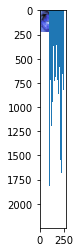

In [ ]:
import numpy as np
import cv2

#img = cv2.imread("images/BSE_Image.jpg")
img = train_images[0]

#img = cv2.imread("images/BSE.tif", 0)

#Denoise for better results
#from skimage.restoration import denoise_tv_chambolle
#denoised_img = denoise_tv_chambolle(img, weight=0.1, eps=0.0002, n_iter_max=200, multichannel=False)
plt.imshow(img, cmap='gray')
plt.hist(img.flat, bins=100, range=(100,255))

In [ ]:
#We convert the unit8 values to float as it is a requirement of the k-means method of OpenCV
img2 = np.float32(train_images[0])

#Define criteria, number of clusters and apply k-means
#When this criterion is satisfied, the algorithm iteration stops.
#cv.TERM_CRITERIA_EPS — stop the algorithm iteration if specified accuracy, epsilon, is reached.
#cv.TERM_CRITERIA_MAX_ITER — stop the algorithm after the specified number of iterations, max_iter.
#cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER — stop the iteration when any of the above condition is met.
#Max iterations, in this example 10.
#Epsilon, required accuracy, in this example 1.0

criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)

# Number of clusters
k = 30

# Number of attempts, number of times algorithm is executed using different initial labelings.
#Algorithm return labels that yield best compactness.
#compactness : It is the sum of squared distance from each point to their corresponding centers.

attempts = 10

#other flags needed as inputs for K-means
#Specify how initial seeds are taken.
#Two options, cv.KMEANS_PP_CENTERS and cv.KMEANS_RANDOM_CENTERS

ret,label,center=cv2.kmeans(img2, k, None, criteria, attempts, cv2.KMEANS_PP_CENTERS)

#cv2.kmeans outputs 2 parameters.
#1 COmpactness.
#2 Labels: Label array.
#3 Center. the array of centers of clusters. For k=4 we will have 4 centers.
#For RGB image, we will have center for each image, so tota 4x3 = 12.
#Now convert center values from float32 back into uint8.
center = np.uint8(center)

#Next, we have to access the labels to regenerate the clustered image
res = center[label.flatten()]
res2 = res.reshape((img.shape)) #Reshape labels to the size of original image
cv2.imwrite("segmented.jpg", res2)


True

In [ ]:
for i in range(len(train_images)):
  img = train_images[i]
  img2 = np.float32(train_images[i])

  ret,label,center=cv2.kmeans(img2, k, None, criteria, attempts, cv2.KMEANS_PP_CENTERS)
  center = np.uint8(center)

  #Next, we have to access the labels to regenerate the clustered image
  res = center[label.flatten()]
  res2 = res.reshape((img.shape)) #Reshape labels to the size of original image
  train_images[i] = res2


In [ ]:
img = cv2.imread("/content/nwb.jpg")
img = cv2.resize(img, (SIZE_Y, SIZE_X))
imageio.imwrite("/content/nwb.jpg", img)

In [ ]:
np.unique(train_masks)

array([0, 1], dtype=uint8)

In [ ]:
train_images = []
i=0
for directory_path in glob.glob("/content/drive/MyDrive/oral cancer Images/Newimages/"):
    for img_path in glob.glob(os.path.join(directory_path, "*")):
        img = cv2.imread(img_path, 1)
        img = cv2.resize(img, (SIZE_Y, SIZE_X))

        train_images.append(img)
        scipy.misc.imsave("/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/cancer/" + i, img)
        i=i+1

train_images = np.array(train_images)

AttributeError: ignored

In [ ]:
train_images.shape

(83, 224, 224, 1)

In [ ]:
#Capture mask/label info as a list
train_masks = []
for directory_path in glob.glob("/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized masks/"):
    for mask_path in glob.glob(os.path.join(directory_path, "*")):
        mask = cv2.imread(mask_path, 0)
        my_mask = np.where(mask>0, 1, mask)
        #my_mask =  np.expand_dims(resize(my_mask, (SIZE_Y, SIZE_X), mode='constant', preserve_range=True), axis=-1)
        #my_mask = cv2.resize(my_mask, (SIZE_Y, SIZE_X), interpolation = cv2.INTER_NEAREST)  #Otherwise ground truth changes due to interpolation
        train_masks.append(my_mask)

#Convert list to array for machine learning processing
train_masks = np.array(train_masks)
train_masks = np.expand_dims(train_masks, axis = 3)

In [ ]:
print("Image data shape is: ", train_images.shape)
print("Mask data shape is: ", train_masks.shape)
print("Max pixel value in image is: ", train_images.max())
print("Labels in the mask are : ", np.unique(train_masks))

Image data shape is:  (109, 224, 224, 3)
Mask data shape is:  (109, 224, 224, 1)
Max pixel value in image is:  255
Labels in the mask are :  [0 1]


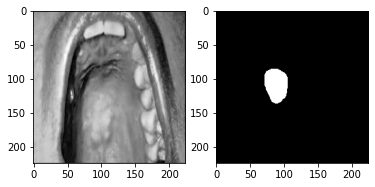

40

In [ ]:
#Sanity check, view few images
import random

image_number = random.randint(0, 82)
#plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(train_images[image_number,:,:,0], cmap='gray')
plt.subplot(122)
plt.imshow(train_masks[image_number,:,:,0], cmap='gray')
plt.show()
image_number

In [ ]:
print(np.unique(train_masks[0]))
#train_images = np.zeros((LENTRAIN, SIZE_Y, SIZE_X, 3), dtype=np.uint8)
#train_masks = np.zeros((LENTRAIN, SIZE_Y, SIZE_X, 1), dtype=np.uint8)

[0 1]


In [ ]:
train_images = np.zeros((124, SIZE_Y, SIZE_X, 3), dtype=np.uint8)
train_masks = np.zeros((124, SIZE_Y, SIZE_X, 1), dtype=np.uint8)
print('Resizing training images')
for n, id_ in tqdm(enumerate(train_ids1), total=len(train_ids1)):
    path = TEST_PATH2
    img = imread(path + '/' + id_)[:,:,:3]
    img = resize(img, (SIZE_Y, SIZE_X), mode='constant', preserve_range=True)
    imageio.imwrite("/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/val/resized nc/" +id_, img)
    #scipy.misc.imsave("/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized cancer/" + id_, img)
    #train_images[n] = img  #Fill empty X_train with values from img
#train_images = np.array(train_images)

Resizing training images


 39%|███▉      | 23/59 [00:18<00:27,  1.30it/s]/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
100%|██████████| 59/59 [00:59<00:00,  1.00s/it]


In [ ]:
train_masks.shape

(83, 224, 224, 1)

In [ ]:
#Add additional daatset from different source

mask = np.zeros((SIZE_Y, SIZE_X, 1), dtype=np.uint8)
i=0
for mask_file in next(os.walk('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized masks'))[2]:
  z = imread('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized masks/'+ mask_file)

  z =  np.expand_dims(resize(z, (SIZE_Y, SIZE_X), mode='constant', preserve_range=True), axis=-1)
  #z = resize(z, (SIZE_Y, SIZE_X), mode='constant', preserve_range=True)
  mask = np.maximum(mask,z)
  my_mask = np.where(z>0, 1, z)
  train_masks[i] = my_mask
  i = i+1
train_masks = np.array(train_masks)
#train_masks = np.expand_dims(train_masks, axis = 3)

In [ ]:
 # img = Image.open('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/mask/'+ mask_file)

 # gray=img.resize((224,224),Image.ANTIALIAS)
 # gray.save('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized masks/'+ mask_file )

In [ ]:
# NOT NEEDED in binary classification
from sklearn.preprocessing import LabelEncoder
labelencoder = LabelEncoder()
n, h, w, c = train_masks.shape
train_masks_reshaped = train_masks.reshape(-1,1)
train_masks_reshaped_encoded = labelencoder.fit_transform(train_masks_reshaped)
train_masks_encoded_original_shape = train_masks_reshaped_encoded.reshape(n, h, w, c)

np.unique(train_masks_encoded_original_shape)

/usr/local/lib/python3.7/dist-packages/sklearn/preprocessing/_label.py:115: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


array([0, 1])

In [ ]:
train_masks.shape #total number of training data : 170 Images

(170, 224, 224, 1)

In [ ]:
train_masks_input = np.expand_dims(train_masks_encoded_original_shape, axis=3)

In [ ]:
train_images.shape

(170, 224, 224, 3)

In [ ]:
train_masks_input.shape

(170, 224, 224, 1, 1)

In [ ]:
#Create a subset of data for quick testing
#Picking 10% for testing and remaining for training
from sklearn.model_selection import train_test_split
X1, X_test, y1, y_test = train_test_split(train_images, train_masks, test_size = 0.25, random_state = 0)

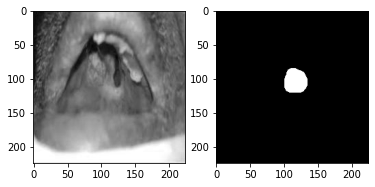

In [ ]:
#Sanity check, view few mages
import random

image_number = random.randint(0, len(X1)-1)
#plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(X1[image_number,:,:,0], cmap='gray')
plt.subplot(122)
plt.imshow(y1[image_number,:,:,0], cmap='gray')
plt.show()

In [ ]:
# NOT NEEDED for now

#Further split training data t a smaller subset for quick testing of models
X_train, X_do_not_use, y_train, y_do_not_use = train_test_split(X1, y1, test_size = 0.5, random_state = 0)

print("Class values in the dataset are ... ", np.unique(y_train))

Class values in the dataset are ...  [0 1]


In [ ]:
# NOT NEEDED in binary classification

from tensorflow.keras.utils import to_categorical
#train_masks_cat = to_categorical(y_train, num_classes=n_classes)
#y_train_cat = train_masks_cat.reshape((y_train.shape[0], y_train.shape[1], y_train.shape[2], n_classes))
y_train_cat = y_train.reshape((y_train.shape[0], y_train.shape[1], y_train.shape[2], n_classes))

test_masks_cat = to_categorical(y_test, num_classes=2)
y_test_cat = test_masks_cat.reshape((y_test.shape[0], y_test.shape[1], y_test.shape[2], 2))
tf.cast(y_test_cat, tf.float64)

In [ ]:
# U-net model initialization:

#Reused parameters in all models

n_classes=1
activation='sigmoid'

LR = 0.0001

optim = tf.keras.optimizers.Adam(LR)

In [ ]:
# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
# set class weights for dice_loss (car: 1.; pedestrian: 2.; background: 0.5;)
dice_loss = sm.losses.DiceLoss(class_weights=np.array([0.25, 0.25, 0.25, 0.25]))
focal_loss = sm.losses.CategoricalFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

In [ ]:
# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]

In [ ]:
import segmentation_models as sm
sm.set_framework('tf.keras')
sm.framework()

#Below here, many models are loaded and trained on this set of data. Each model and their predictions are saved in the drive for future use so we don't have to train them again for every session.

'tf.keras'

In [ ]:
###Model 1
BACKBONE1 = 'resnet34'
preprocess_input1 = sm.get_preprocessing(BACKBONE1)
#ResNet18, preprocess_input = Classifiers.get('resnet18')
#resnet = ResNet18((224, 224, 3), include_top=False)
#preprocess_input1 = resnet

# preprocess input
X_train1 = preprocess_input1(X1)
X_test1 = preprocess_input1(X_test)

# define model
model1 = sm.Unet(BACKBONE1, encoder_weights='imagenet', classes=n_classes, activation=activation)

# compile keras model with defined optimozer, loss and metrics
model1.compile(optim, loss='binary_crossentropy', metrics=metrics)

#model1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)

print(model1.summary())

85521592/85521592 [==============================] - 1s 0us/step
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 data (InputLayer)              [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 bn_data (BatchNormalization)   (None, None, None,   9           ['data[0][0]']                   
                                3)                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, None, None,   0          ['bn_data[0][0]']                
                           

In [ ]:
# Training the model
history1=model1.fit(X1,
          y1,
          batch_size=16,
          epochs=50,
          verbose=1,
          validation_data=(X_test, y_test))

Epoch 1/50
11/11 [==============================] - 242s 22s/step - loss: 0.2800 - iou_score: 0.0727 - f1-score: 0.1345 - val_loss: 0.4472 - val_iou_score: 0.0014 - val_f1-score: 0.0028
Epoch 2/50
11/11 [==============================] - 207s 19s/step - loss: 0.2587 - iou_score: 0.2296 - f1-score: 0.3660 - val_loss: 0.4174 - val_iou_score: 0.0060 - val_f1-score: 0.0119
Epoch 3/50
11/11 [==============================] - 205s 19s/step - loss: 0.2372 - iou_score: 0.3886 - f1-score: 0.5570 - val_loss: 0.3635 - val_iou_score: 0.0154 - val_f1-score: 0.0302
Epoch 4/50
11/11 [==============================] - 208s 19s/step - loss: 0.2216 - iou_score: 0.4268 - f1-score: 0.5959 - val_loss: 0.3549 - val_iou_score: 0.0531 - val_f1-score: 0.1006
Epoch 5/50
11/11 [==============================] - 204s 19s/step - loss: 0.2101 - iou_score: 0.4333 - f1-score: 0.5974 - val_loss: 0.3160 - val_iou_score: 0.0024 - val_f1-score: 0.0047
Epoch 6/50
11/11 [==============================] - 205s 19s/step - lo

In [ ]:
# convert the history.history dict to a pandas DataFrame:
hist_df = pd.DataFrame(history1.history)

# or save to csv: Predicted csv file is saved to drive for analysis later
hist_csv_file = '/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsR6/history1.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

In [ ]:
his1 = pd.read_csv('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsR6/history1.csv')

In [ ]:
model1.save('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsR6/res34_25p_val_50epochs.hdf5')
#Model is saved to the drive as well

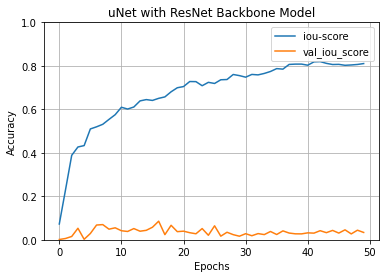

In [ ]:
#Graph to show iou_score of the model on the data
fig1 = plt.gcf()
plt.plot(his1['iou_score'])
plt.plot(his1['val_iou_score'])
plt.axis(ymin=0,ymax=1)
plt.grid()
plt.title('uNet with ResNet Backbone Model')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['iou-score', 'val_iou_score'])
plt.show()

In [ ]:
###Model 2

BACKBONE2 = 'inceptionv3'
preprocess_input2 = sm.get_preprocessing(BACKBONE2)

# preprocess input
X_train2 = preprocess_input2(X1)
X_test2 = preprocess_input2(X_test)

# define model
model2 = sm.Unet(BACKBONE2, encoder_weights='imagenet', classes=n_classes, activation=activation)


# compile keras model with defined optimozer, loss and metrics
model2.compile(optim, loss='binary_crossentropy', metrics=metrics)
#model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)


#print(model2.summary())

87910968/87910968 [==============================] - 8s 0us/step


In [ ]:
# Training the model

history2=model2.fit(X1,
          y1,
          batch_size=16,
          epochs=50,
          verbose=1,
          validation_data=(X_test, y_test))

Epoch 1/50
11/11 [==============================] - 295s 25s/step - loss: 0.5478 - iou_score: 0.0620 - f1-score: 0.1164 - val_loss: 3.3512 - val_iou_score: 0.0611 - val_f1-score: 0.1146
Epoch 2/50
11/11 [==============================] - 248s 23s/step - loss: 0.4828 - iou_score: 0.1138 - f1-score: 0.2028 - val_loss: 4.1613 - val_iou_score: 0.0613 - val_f1-score: 0.1150
Epoch 3/50
11/11 [==============================] - 248s 23s/step - loss: 0.4318 - iou_score: 0.2152 - f1-score: 0.3510 - val_loss: 4.0169 - val_iou_score: 0.0619 - val_f1-score: 0.1161
Epoch 4/50
11/11 [==============================] - 249s 23s/step - loss: 0.3936 - iou_score: 0.2938 - f1-score: 0.4506 - val_loss: 3.1623 - val_iou_score: 0.0656 - val_f1-score: 0.1226
Epoch 5/50
11/11 [==============================] - 248s 23s/step - loss: 0.3601 - iou_score: 0.3663 - f1-score: 0.5334 - val_loss: 2.1958 - val_iou_score: 0.0686 - val_f1-score: 0.1278
Epoch 6/50
11/11 [==============================] - 249s 23s/step - lo

In [ ]:
# convert the history.history dict to a pandas DataFrame:
hist_df = pd.DataFrame(history2.history)

# or save to csv:
hist_csv_file = '/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsR6/history2.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)


In [ ]:

his2 = pd.read_csv('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsR6/history2.csv')

In [ ]:
model2.save('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsR6/inceptionv3_25p_val_50epochs.hdf5')

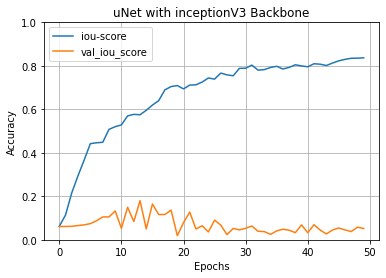

In [ ]:
fig1 = plt.gcf()
plt.plot(history2.history['iou_score'])
plt.plot(history2.history['val_iou_score'])
plt.axis(ymin=0,ymax=1)
plt.grid()
plt.title('uNet with inceptionV3 Backbone')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['iou-score', 'val_iou_score'])
plt.show()

In [ ]:
###Model 3

BACKBONE3 = 'resnext101'
preprocess_input3 = sm.get_preprocessing(BACKBONE3)

# preprocess input
X_train3 = preprocess_input3(X1)
X_test3 = preprocess_input3(X_test)


# define model
model3 = sm.Unet(BACKBONE3, encoder_weights='imagenet', classes=n_classes, activation=activation)

# compile keras model with defined optimozer, loss and metrics
model3.compile(optim, loss='binary_crossentropy', metrics=metrics)
#model3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)


print(model3.summary())

Streaming output truncated to the last 5000 lines.
                                                                                                  
 stage3_unit7_relu2 (Activation  (None, None, None,   0          ['stage3_unit7_bn2[0][0]']       
 )                              512)                                                              
                                                                                                  
 stage3_unit7_conv3 (Conv2D)    (None, None, None,   524288      ['stage3_unit7_relu2[0][0]']     
                                1024)                                                             
                                                                                                  
 stage3_unit7_bn3 (BatchNormali  (None, None, None,   4096       ['stage3_unit7_conv3[0][0]']     
 zation)                        1024)                                                             
                                                          

In [ ]:
history3=model3.fit(X1,
          y1,
          batch_size=8,
          epochs=50,
          verbose=1,
          validation_data=(X_test, y_test))

Epoch 1/50
10/10 [==============================] - 193s 14s/step - loss: 0.8361 - iou_score: 0.0801 - f1-score: 0.1470 - val_loss: 10.6253 - val_iou_score: 0.0706 - val_f1-score: 0.1319
Epoch 2/50
10/10 [==============================] - 126s 13s/step - loss: 0.5726 - iou_score: 0.1864 - f1-score: 0.3114 - val_loss: 16.8705 - val_iou_score: 0.0715 - val_f1-score: 0.1335
Epoch 3/50
10/10 [==============================] - 125s 12s/step - loss: 0.4633 - iou_score: 0.2469 - f1-score: 0.3883 - val_loss: 5.5847 - val_iou_score: 0.0720 - val_f1-score: 0.1343
Epoch 4/50
10/10 [==============================] - 127s 12s/step - loss: 0.3903 - iou_score: 0.2828 - f1-score: 0.4372 - val_loss: 3.9410 - val_iou_score: 0.0745 - val_f1-score: 0.1386
Epoch 5/50
10/10 [==============================] - 125s 12s/step - loss: 0.3434 - iou_score: 0.2778 - f1-score: 0.4208 - val_loss: 32.7217 - val_iou_score: 0.0722 - val_f1-score: 0.1346
Epoch 6/50
10/10 [==============================] - 125s 12s/step -

In [ ]:
with open('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/History/trainHistoryDict', 'wb') as file_pi_1:
   pickle.dump(history1.history, file_pi_1)

In [ ]:
model3.save('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/Models/resnext101_backbone_50epochs.hdf5')

In [ ]:
fig1 = plt.gcf()
plt.plot(history3.history['iou_score'])
plt.plot(history3.history['f1-score'])
plt.axis(ymin=0,ymax=1)
plt.grid()
plt.title('uNet with vgg16 Backbone Model')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['iou-score', 'f1-score'])
plt.show()

In [ ]:
#plot the training and validation accuracy and loss at each epoch
loss = history1.history['loss']
val_loss = history1.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
acc = history1.history['iou_score']
loss = history1.history['loss']
val_acc = history1.history['val_iou_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, acc, 'y', label='Training IOU')
plt.plot(epochs, val_acc, 'r', label='Validation IOU')
plt.title('Training and validation IOU')
plt.xlabel('Epochs')
plt.ylabel('IOU')
plt.legend()
plt.show()

In [ ]:
acc = history2.history['iou_score']
loss = history2.history['loss']
val_acc = history2.history['val_iou_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, acc, 'y', label='Training IOU')
plt.plot(epochs, val_acc, 'r', label='Validation IOU')
plt.title('Training and validation IOU')
plt.xlabel('Epochs')
plt.ylabel('IOU')
plt.legend()
plt.show()

In [ ]:
acc = history3.history['iou_score']
loss = history3.history['loss']
val_acc = history3.history['val_iou_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, acc, 'y', label='Training IOU')
plt.plot(epochs, val_acc, 'r', label='Validation IOU')
plt.title('Training and validation IOU')
plt.xlabel('Epochs')
plt.ylabel('IOU')
plt.legend()
plt.show()

In [ ]:
###Model 4

BACKBONE4 = 'resnet101'
preprocess_input4 = sm.get_preprocessing(BACKBONE4)

# preprocess input
X_train4 = preprocess_input4(X1)
X_test4 = preprocess_input4(X_test)


# define model
model4 = sm.Unet(BACKBONE4, encoder_weights='imagenet', classes=n_classes, activation=activation)

# compile keras model with defined optimozer, loss and metrics
model4.compile(optim, loss='binary_crossentropy', metrics=metrics)
#model3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)


#print(model4.summary())

171164896/171164896 [==============================] - 2s 0us/step


In [ ]:
history4=model4.fit(X1,
          y1,
          batch_size=16,
          epochs=50,
          verbose=1,
          validation_data=(X_test, y_test))

Epoch 1/50
11/11 [==============================] - 431s 38s/step - loss: 0.5196 - iou_score: 0.0649 - f1-score: 0.1214 - val_loss: 0.8215 - val_iou_score: 0.0710 - val_f1-score: 0.1319
Epoch 2/50
11/11 [==============================] - 396s 36s/step - loss: 0.4455 - iou_score: 0.1305 - f1-score: 0.2295 - val_loss: 1.3273 - val_iou_score: 0.0680 - val_f1-score: 0.1268
Epoch 3/50
11/11 [==============================] - 394s 36s/step - loss: 0.3819 - iou_score: 0.2342 - f1-score: 0.3762 - val_loss: 1.3762 - val_iou_score: 0.0729 - val_f1-score: 0.1354
Epoch 4/50
11/11 [==============================] - 398s 37s/step - loss: 0.3349 - iou_score: 0.3324 - f1-score: 0.4935 - val_loss: 1.0159 - val_iou_score: 0.0840 - val_f1-score: 0.1543
Epoch 5/50
11/11 [==============================] - 395s 36s/step - loss: 0.2994 - iou_score: 0.3789 - f1-score: 0.5480 - val_loss: 0.8363 - val_iou_score: 0.0939 - val_f1-score: 0.1710
Epoch 6/50
11/11 [==============================] - 394s 36s/step - lo

In [ ]:
# convert the history.history dict to a pandas DataFrame:
hist_df = pd.DataFrame(history4.history)

# or save to csv:
hist_csv_file = '/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsR6/history4.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

his4 = pd.read_csv('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsR6/history4.csv')

In [ ]:
his4 = pd.read_csv('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsR6/history4.csv')

In [ ]:
model4.save('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsRadd/resnet101_25_p_50epochs.hdf5')

In [ ]:
acc = history4.history['iou_score']
loss = history4.history['loss']
val_acc = history4.history['val_iou_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, acc, 'y', label='Training IOU')
plt.plot(epochs, val_acc, 'r', label='Validation IOU')
plt.title('Training and validation IOU')
plt.xlabel('Epochs')
plt.ylabel('IOU')
plt.legend()
plt.show()

In [ ]:
###Model 7

#BACKBONE7 = 'NULL'
#preprocess_input7 = sm.get_preprocessing(BACKBONE7)

# preprocess input
#X_train7 = preprocess_input7(X1)
#X_test7 = preprocess_input7(X_test)


# define model
model7 = sm.Unet(encoder_weights='imagenet', classes=n_classes, activation=activation)

# compile keras model with defined optimozer, loss and metrics
model7.compile(optim, loss='binary_crossentropy', metrics=metrics)
#model3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)


print(model7.summary())

58889256/58889256 [==============================] - 2s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 block1_conv1 (Conv2D)          (None, None, None,   1792        ['input_1[0][0]']                
                                64)                                                               
                                                                                                  
 block1_conv2 (Conv2D)          (None, None, None,   36928       ['block1_conv1[0][0]']           
                             

In [ ]:
history7=model7.fit(X1,
          y1,
          batch_size=8,
          epochs=50,
          verbose=1,
          validation_data=(X_test, y_test))

Epoch 1/50
22/22 [==============================] - 340s 15s/step - loss: 0.7653 - iou_score: 0.0575 - f1-score: 0.1080 - val_loss: 0.9350 - val_iou_score: 0.0595 - val_f1-score: 0.1116
Epoch 2/50
22/22 [==============================] - 336s 15s/step - loss: 0.6390 - iou_score: 0.0547 - f1-score: 0.1032 - val_loss: 0.8580 - val_iou_score: 0.0641 - val_f1-score: 0.1197
Epoch 3/50
22/22 [==============================] - 334s 15s/step - loss: 0.5494 - iou_score: 0.0397 - f1-score: 0.0761 - val_loss: 0.6303 - val_iou_score: 0.0650 - val_f1-score: 0.1210
Epoch 4/50
22/22 [==============================] - 337s 15s/step - loss: 0.4789 - iou_score: 0.0229 - f1-score: 0.0446 - val_loss: 0.5343 - val_iou_score: 0.0372 - val_f1-score: 0.0712
Epoch 5/50
22/22 [==============================] - 335s 15s/step - loss: 0.4274 - iou_score: 0.0126 - f1-score: 0.0247 - val_loss: 0.4449 - val_iou_score: 0.0108 - val_f1-score: 0.0214
Epoch 6/50
22/22 [==============================] - 338s 15s/step - lo

In [ ]:
# convert the history.history dict to a pandas DataFrame:
hist_df = pd.DataFrame(history7.history)

# or save to csv:
hist_csv_file = '/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsR6/history7.csv'
with open(hist_csv_file, mode='w') as f:
    hist_df.to_csv(f)

his7 = pd.read_csv('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsR6/history7.csv')

In [ ]:
his7 = pd.read_csv('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsR6/history7.csv')

In [ ]:
model7.save('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsRadd/noBackbone_25_p_50epochs.hdf5')

In [ ]:
acc = history7.history['iou_score']
loss = history7.history['loss']
val_acc = history7.history['val_iou_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, acc, 'y', label='Training IOU')
plt.plot(epochs, val_acc, 'r', label='Validation IOU')
plt.title('Training and validation IOU')
plt.xlabel('Epochs')
plt.ylabel('IOU')
plt.legend()
plt.show()

In [ ]:
###Model 5

BACKBONE5 = 'efficientnetb7'
preprocess_input5 = sm.get_preprocessing(BACKBONE5)

# preprocess input
X_train5 = preprocess_input5(X1)
X_test5 = preprocess_input5(X_test)


# define model
model5 = sm.Unet(BACKBONE5, encoder_weights='imagenet', classes=n_classes, activation=activation)

# compile keras model with defined optimozer, loss and metrics
model5.compile(optim, loss='binary_crossentropy', metrics=metrics)
#model3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)


print(model5.summary())

258449408/258434480 [==============================] - 6s 0us/step
Model: "model_7"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 stem_conv (Conv2D)             (None, None, None,   1728        ['input_2[0][0]']                
                                64)                                                               
                                                                                                  
 stem_bn (BatchNormalization)   (None, None, None,   256         ['stem_conv[0][0]']              
                         

In [ ]:
history5=model5.fit(X1,
          y1,
          batch_size=8,
          epochs=50,
          verbose=1,
          validation_data=(X_test, y_test))

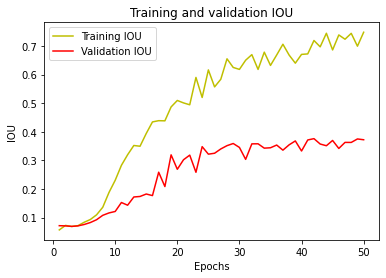

In [ ]:
acc = history5.history['iou_score']
loss = history5.history['loss']
val_acc = history5.history['val_iou_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, acc, 'y', label='Training IOU')
plt.plot(epochs, val_acc, 'r', label='Validation IOU')
plt.title('Training and validation IOU')
plt.xlabel('Epochs')
plt.ylabel('IOU')
plt.legend()
plt.show()

In [ ]:
model5.save('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/Models/efficientnetb7_backbone_50epochs.hdf5')

In [ ]:
###Model 6

BACKBONE6 = 'densenet201'
preprocess_input6 = sm.get_preprocessing(BACKBONE6)

# preprocess input
X_train6 = preprocess_input6(X1)
X_test6 = preprocess_input6(X_test)


# define model
model6 = sm.Unet(BACKBONE6, encoder_weights='imagenet', classes=n_classes, activation=activation)

# compile keras model with defined optimozer, loss and metrics
model6.compile(optim, loss='binary_crossentropy', metrics=metrics)
#model3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=metrics)


print(model6.summary())

74850304/74836368 [==============================] - 2s 0us/step
Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, None, None,   0          ['input_9[0][0]']                
                                3)                                                                
                                                                                                  
 conv1/conv (Conv2D)            (None, None, None,   9408        ['zero_padding2d[0][0]']         
                           

In [ ]:
history6=model6.fit(X1,
          y1,
          batch_size=8,
          epochs=50,
          verbose=1,
          validation_data=(X_test, y_test))

Epoch 1/50
10/10 [==============================] - 137s 8s/step - loss: 0.5628 - iou_score: 0.0962 - f1-score: 0.1716 - val_loss: 3.8589 - val_iou_score: 0.0705 - val_f1-score: 0.1317
Epoch 2/50
10/10 [==============================] - 80s 8s/step - loss: 0.3921 - iou_score: 0.1754 - f1-score: 0.2918 - val_loss: 9.8863 - val_iou_score: 0.0702 - val_f1-score: 0.1312
Epoch 3/50
10/10 [==============================] - 78s 8s/step - loss: 0.3067 - iou_score: 0.1935 - f1-score: 0.3206 - val_loss: 4.9410 - val_iou_score: 0.0574 - val_f1-score: 0.1078
Epoch 4/50
10/10 [==============================] - 84s 8s/step - loss: 0.2604 - iou_score: 0.2259 - f1-score: 0.3650 - val_loss: 2.6980 - val_iou_score: 0.0699 - val_f1-score: 0.1295
Epoch 5/50
10/10 [==============================] - 80s 8s/step - loss: 0.2305 - iou_score: 0.1727 - f1-score: 0.2867 - val_loss: 0.7170 - val_iou_score: 0.0794 - val_f1-score: 0.1468
Epoch 6/50
10/10 [==============================] - 80s 8s/step - loss: 0.2081 

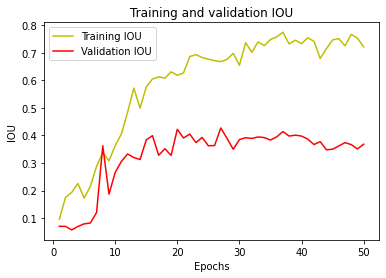

In [ ]:
acc = history6.history['iou_score']
loss = history6.history['loss']
val_acc = history6.history['val_iou_score']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, acc, 'y', label='Training IOU')
plt.plot(epochs, val_acc, 'r', label='Validation IOU')
plt.title('Training and validation IOU')
plt.xlabel('Epochs')
plt.ylabel('IOU')
plt.legend()
plt.show()

In [ ]:
model6.save('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/Models/densenet201_backbone_50epochs.hdf5')

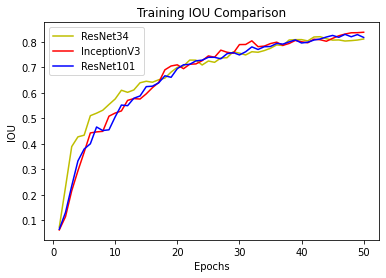

In [ ]:
acc1 = his1['iou_score']
acc2 = his2['iou_score']
acc4 = his4['iou_score']
epochs = range(1, len(acc1) + 1)
plt.plot(epochs, acc1, 'y', label='ResNet34')
plt.plot(epochs, acc2, 'r', label='InceptionV3')
plt.plot(epochs, acc4, 'b', label='ResNet101')
plt.title('Training IOU Comparison')
plt.xlabel('Epochs')
plt.ylabel('IOU')
plt.legend()
plt.show()
# IOU Score of three models are compared here

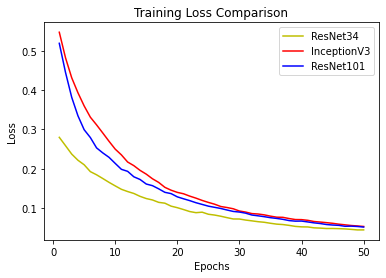

In [ ]:
acc1 = his1['loss']
acc2 = his2['loss']
acc4 = his4['loss']
epochs = range(1, len(acc1) + 1)
plt.plot(epochs, acc1, 'y', label='ResNet34')
plt.plot(epochs, acc2, 'r', label='InceptionV3')
plt.plot(epochs, acc4, 'b', label='ResNet101')
plt.title('Training Loss Comparison')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()
# Loss of three models are compared here

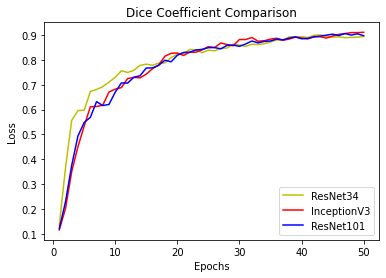

In [ ]:
acc1 = his1['f1-score']
acc2 = his2['f1-score']
acc4 = his4['f1-score']
epochs = range(1, len(acc1) + 1)
plt.plot(epochs, acc1, 'y', label='ResNet34')
plt.plot(epochs, acc2, 'r', label='InceptionV3')
plt.plot(epochs, acc4, 'b', label='ResNet101')
plt.title('Dice Coefficient Comparison')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()
# Dice Coefficient of three models are compared here

In [ ]:
from keras.models import load_model

In [ ]:
### FOR NOW LET US FOCUS ON A SINGLE MODEL

#Models are loaded back from the drive for further use
#NOTE: These models took hours and at times multiple tries to train the whole dataset. So it was essential to save them in our drive abd then use them as here for next sessions:

#Set compile=False as we are not loading it for training, only for prediction.
model1 = load_model('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsR6/res34_25p_val_50epochs.hdf5', compile=False)
model2 = load_model('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsR6/inceptionv3_25p_val_50epochs.hdf5', compile=False)
#model3 = load_model('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/Models/resnext101_backbone_50epochs.hdf5', compile=False)
model4 = load_model('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsRadd/resnet101_25_p_50epochs.hdf5', compile=False)
#model5 = load_model('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/Models/efficientnetb7_backbone_50epochs.hdf5', compile=False)
#model6 = load_model('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/Models/densenet201_backbone_50epochs.hdf5', compile=False)


In [ ]:
#IOU
y_pred1 = model1.predict(X1)
#y_pred1_argmax=np.argmax(y_pred1, axis=3)

#NP array of training images is passed to the models which give us output of predictions in np array fromat

In [ ]:
#Using built in keras function
#from keras.metrics import MeanIoU
n_classes = 2
IOU_keras = MeanIoU(num_classes=n_classes)
IOU_keras.update_state(y1, y_pred1)

overlap = y1[:,:,:,:] * y_pred1[:,:,:,:] # Logical AND
overlap = np.where(overlap[:,:,:,:] > 0.5, 1, 0)

union = y1[:,:,:,:] + y_pred1[:,:,:,:] # Logical OR
union = np.where(union[:,:,:,:] > 0.5, 1, 0)

IOU = overlap.sum()/float(union.sum())

print(np.unique(y1[:,:,:,0]))
print(np.unique(y_pred1[:,:,:,0]))
#print(np.unique(y_pred1_argmax[:,:,0]))
print(np.unique(overlap[:,:,:,0]))
print(np.unique(union[:,:,:,0]))

#overlap[:,:,:,1] = [1 if a_ > 0.5 else 0 for a_ in overlap[:,:,:] ]
#overlap = np.where(overlap[:,:,:,:] > 0.5, 1, 0)
#overlaps = [np.where(overlap[:,:,:,0]>0.5, 1, overlap[:,:,:,0]) for overlap[:,:,:,:] in overlap]
#print(np.unique(overlap[:,:,:,:]))

#print("Mean IoU =", IOU_keras.result().numpy())
IOU



[0 1]
[0.02486244 0.02488235 0.02563155 ... 0.9999998  0.9999999  1.        ]
[0]
[0 1]
[0 1]


0.6270152476139872

In [ ]:
#To calculate I0U for each class...
values = np.array(IOU_keras.get_weights()).reshape(n_classes, n_classes)
print(values)
class1_IoU = values[0,0]/(values[0,0] + values[0,1] + values[1,0])
class2_IoU = values[1,1]/(values[1,1] + values[1,0] + values[0,1])

print("IoU for class1 is: ", class1_IoU)
print("IoU for class2 is: ", class2_IoU)

[[3.819995e+06 0.000000e+00]
 [2.435440e+05 7.170000e+02]]
IoU for class1 is:  0.94006604
IoU for class2 is:  0.0029353846


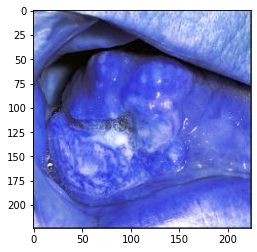

In [ ]:
#Verify the prediction on first image
plt.imshow(train_images[0])

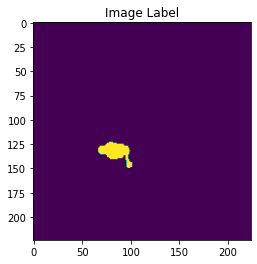

In [ ]:
plt.title('Image Label')
plt.imshow(train_masks[0][:,:,0])

In [ ]:
test_img_input1 = preprocess_input3(train_images[1])
test_pred1 = model4.predict(test_img_input1)
test_prediction1 = np.argmax(test_pred1, axis=3)[0,:,:]
#im = Image.fromarray(test_prediction1)
#im.save(d+f"{i}.jpeg")

#y_img = np.argmax(ground_truth, axis=3)
plt.title('Prediction Image')
plt.imshow(test_prediction1[0])

In [ ]:
#from keras.preprocessing.image import img_to_array
from tensorflow.keras.utils import load_img, img_to_array
img1 = load_img('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized cancer/3.jpg', target_size=(224, 224)) #VGG user 224 as input
#imgM1 = load_img('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized masks/3.jpg', target_size=(224, 224)) #VGG user 224 as input
#img3 = load_img('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized cancer/3.jpg', target_size=(224, 224)) #VGG user 224 as input

# convert the image to an array
img = img_to_array(img1)
#imgM1 = img_to_array(img2)
#img3 = img_to_array(img3)
# expand dimensions to match the shape of model input
img1 = np.expand_dims(img1, axis=0)

1/1 [==============================] - 0s 345ms/step


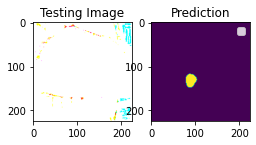

In [ ]:
#NOT WORKING. CHECK NEXT BLOCK

import random
from PIL import Image
test_img_number = 0
#for i in range(len(train_images)):

#test_img = train_images[test_img_number]
#test_img = img1
#ground_truth = train_masks[test_img_number]
#test_img_input = np.expand_dims(test_img, 0)

#test_img_input1 = preprocess_input1(test_img_input)

#test_pred1 = model1.predict(test_img_input1)
#test_prediction1 = np.argmax(test_pred1, axis=3)
#im = Image.fromarray(test_prediction1)
#im.save(d+f"{i}.jpeg")
prediction = (model2.predict(img1)[0,:,:,0] > 0.5).astype(np.uint8)

#y_img = np.argmax(ground_truth, axis=3)
plt.subplot(231)
plt.title('Testing Image')
#plt.imshow(train_images[test_img_number])
plt.imshow(img)
#plt.savefig("Testing image.png")
#im.save(d+f"{i}.jpeg")

#plt.subplot(232)
#plt.title('Testing Label')
#gt=ground_truth[:,:,0]
#plt.imshow(gt)
#plt.savefig("Testing labe.png")

plt.subplot(232)
plt.title('Prediction')
plt.imshow(prediction)
plt.legend(['malign', 'benign'])
#plt.savefig("Prediction image.png")

In [ ]:
features = model4.predict(test_img_input)
train_features = features.reshape(features.shape[0], features.shape[-1], features.shape[1], features.shape[2])
filename = 'Resnet101_features'
np.savez(filename, feature = train_features)

In [ ]:
btlneck = np.load('Resnet101_features.npz')
train_features = btlneck['feature']

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:18: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:24: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:30: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version,

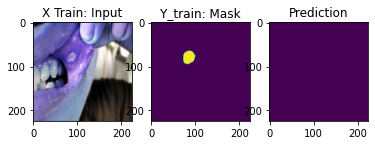

In [ ]:
#Not using this block

import random
from PIL import Image
test_img_number = random.randint(0, len(train_images))
for i in range(len(train_images)):
  test_img = train_images[i]
  ground_truth=train_masks[i]
  test_img_input=np.expand_dims(test_img, 0)

  #test_img_input1 = preprocess_input3(test_img_input)

  prediction = (model4.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8)
  #prediction = model2.predict(test_img_input1)
  #test_prediction1 = np.argmax(prediction, axis=3)
  #im = Image.fromarray(test_prediction1)
  # im.save(d+f"{i}.jpeg")

  #y_img = np.argmax(ground_truth, axis=3)
  plt.subplot(231)
  plt.title('X Train: Input')
  plt.imshow(train_images[i])
  #plt.savefig("Testing image.png")
  #im.save(d+f"{i}.jpeg")

  plt.subplot(232)
  plt.title('Y_train: Mask')
  gt=ground_truth[:,:,0]
  plt.imshow(gt)
  #plt.savefig("Testing labe.png")

  plt.subplot(233)
  plt.title('Prediction')
  plt.imshow(prediction)
  #plt.legend(['malign', 'benign'])
  plt.savefig("/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/ModelsR3/Predictions/Resnet101_p/" + str(i) +  ".png")

In [ ]:
#Predictions from all the models are loaded here

#preds = [model.predict(X_test) for model in models]

pred_threshold = 0.5

pred1 = model1.predict(train_images)

pred2 = model2.predict(train_images)

#pred3 = model3.predict(train_images)

pred4 = model4.predict(train_images)

#pred5 = model5.predict(train_images)

#pred6 = model6.predict(train_images)

8/8 [==============================] - 106s 13s/step


In [ ]:
pred1_b = np.where(pred1[:,:,:,:] > pred_threshold, 1, 0)

pred2_b = np.where(pred2[:,:,:,:] > pred_threshold, 1, 0)

#pred3_b = np.where(pred3[:,:,:,:] > pred_threshold, 1, 0)

pred4_b = np.where(pred4[:,:,:,:] > pred_threshold, 1, 0)

#pred5_b = np.where(pred5[:,:,:,:] > pred_threshold, 1, 0)

#pred6_b = np.where(pred6[:,:,:,:] > pred_threshold, 1, 0)

#Predictions are noramlized, with values above a certain threshold being 1 and others 0

In [ ]:
#IOU Score is calculated here from the predictions

overlap_threshold = 0.5
union_threshold = 0.99

overlap1 = train_masks[:,:,:,:] * pred1[:,:,:,:] # Logical AND
overlap1 = np.where(overlap1[:,:,:,:] > overlap_threshold, 1, 0)
overlap2 = train_masks[:,:,:,:] * pred2[:,:,:,:] # Logical AND
overlap2 = np.where(overlap2[:,:,:,:] > overlap_threshold, 1, 0)
#overlap3 = train_masks[:,:,:,:] * pred3[:,:,:,:] # Logical AND
#overlap3 = np.where(overlap3[:,:,:,:] > overlap_threshold, 1, 0)
overlap4 = train_masks[:,:,:,:] * pred4[:,:,:,:] # Logical AND
overlap4 = np.where(overlap4[:,:,:,:] > overlap_threshold, 1, 0)
#overlap5 = train_masks[:,:,:,:] * pred5[:,:,:,:] # Logical AND
#overlap5 = np.where(overlap5[:,:,:,:] > overlap_threshold, 1, 0)
#overlap6 = train_masks[:,:,:,:] * pred6[:,:,:,:] # Logical AND
#overlap6 = np.where(overlap6[:,:,:,:] > overlap_threshold, 1, 0)

union1 = train_masks[:,:,:,:] + pred1[:,:,:,:] # Logical OR
union1 = np.where(union1[:,:,:,:] > union_threshold, 1, 0)
union2 = train_masks[:,:,:,:] + pred2[:,:,:,:] # Logical OR
union2 = np.where(union2[:,:,:,:] > union_threshold, 1, 0)
#union3 = train_masks[:,:,:,:] + pred3[:,:,:,:] # Logical OR
#union3 = np.where(union3[:,:,:,:] > union_threshold, 1, 0)
union4 = train_masks[:,:,:,:] + pred4[:,:,:,:] # Logical OR
union4 = np.where(union4[:,:,:,:] > union_threshold, 1, 0)
#union5 = train_masks[:,:,:,:] + pred5[:,:,:,:] # Logical OR
#union5 = np.where(union5[:,:,:,:] > union_threshold, 1, 0)
#union6 = train_masks[:,:,:,:] + pred6[:,:,:,:] # Logical OR
#union6 = np.where(union6[:,:,:,:] > union_threshold, 1, 0)

IOU1 = overlap1.sum()/float(union1.sum())
IOU2 = overlap2.sum()/float(union2.sum())
#IOU3 = overlap3.sum()/float(union3.sum())
IOU4 = overlap4.sum()/float(union4.sum())
#IOU5 = overlap5.sum()/float(union5.sum())
#IOU6 = overlap6.sum()/float(union6.sum())

print('IOU Score for model1 = ', IOU1)
print('IOU Score for model2 = ', IOU2)
#print('IOU Score for model3 = ', IOU3)
print('IOU Score for model4 = ', IOU4)
#print('IOU Score for model5 = ', IOU5)
#print('IOU Score for model6 = ', IOU6)

IOU Score for model1 =  0.6543594460842977
IOU Score for model2 =  0.6685733807794753
IOU Score for model4 =  0.6327530046728479


In [ ]:
#Weighted average approach to calculate IOU Score

from sklearn.metrics import accuracy_score
#Weighted average ensemble
weights = [0.3, 0.5, 0.3]
preds=np.array([pred1, pred2, pred4])

#Use tensordot to sum the products of all elements over specified axes.
weighted_preds = np.tensordot(preds, weights, axes=((0),(0)))
weighted_ensemble_prediction = np.argmax(weighted_preds, axis=3)

union_threshold = 0.99
overlap_threshold = 0.99

#print(np.unique(weighted_preds[:,:,:,0]))

overlap = train_masks[:,:,:,:] * weighted_preds[:,:,:,:] # Logical AND
overlap = np.where(overlap[:,:,:,:] > overlap_threshold, 1, 0)

union = train_masks[:,:,:,:] + weighted_preds[:,:,:,:] # Logical OR
union = np.where(union[:,:,:,:] > union_threshold, 1, 0)

IOU = overlap.sum()/float(union.sum())
IOU

0.8130953256852436

In [ ]:
#Grid search for the best combination of w1, w2, w3 that gives maximum acuracy

import pandas as pd
df = pd.DataFrame([])

models = [ model1, model2, model4]
preds=np.array([ pred1, pred2, pred4])

union_threshold = 0.99
overlap_threshold = 0.5

for w1 in range(0, 10):
    for w2 in range(0, 10):
        for w3 in range(0, 10):
            wts = [w1/10.,w2/10.,w3/10.]

            wted_preds = np.tensordot(preds, wts, axes=((0),(0)))

            #wted_ensemble_pred = np.argmax(wted_preds, axis=3)
            if(w1+w2+w3 > 9):
              overlap = train_masks[:,:,:,:] * wted_preds[:,:,:,:] # Logical AND
              overlap = np.where(overlap[:,:,:,:] > overlap_threshold, 1, 0)

              union = train_masks[:,:,:,:] + wted_preds[:,:,:,:] # Logical OR
              union = np.where(union[:,:,:,:] > union_threshold, 1, 0)

              IOU = overlap.sum()/float(union.sum())
              print("Now predciting for weights :", w1/10., w2/10., w3/10., " : IOU = ", IOU)
              df = df.append(pd.DataFrame({'wt1':wts[0],'wt2':wts[1],
                                         'wt3':wts[2], 'IOU': IOU}, index=[0]), ignore_index=True)

max_iou_row = df.iloc[df['IOU'].idxmax()]
print("Max IOU of ", max_iou_row[3], " obained with w1=", max_iou_row[0],
      " w2=", max_iou_row[1], " and w3=", max_iou_row[2])


#############################################################

Now predciting for weights : 0.0 0.1 0.9  : IOU =  0.6350555918901243
Now predciting for weights : 0.0 0.2 0.8  : IOU =  0.6375907945588858
Now predciting for weights : 0.0 0.2 0.9  : IOU =  0.6508138082525394
Now predciting for weights : 0.0 0.3 0.7  : IOU =  0.6405148090589495
Now predciting for weights : 0.0 0.3 0.8  : IOU =  0.6539255951670289
Now predciting for weights : 0.0 0.3 0.9  : IOU =  0.6667798174698885
Now predciting for weights : 0.0 0.4 0.6  : IOU =  0.6437163535134254
Now predciting for weights : 0.0 0.4 0.7  : IOU =  0.657467576078683
Now predciting for weights : 0.0 0.4 0.8  : IOU =  0.671108523750039
Now predciting for weights : 0.0 0.4 0.9  : IOU =  0.6798203691618863
Now predciting for weights : 0.0 0.5 0.5  : IOU =  0.6473898603062117
Now predciting for weights : 0.0 0.5 0.6  : IOU =  0.6618407383968764
Now predciting for weights : 0.0 0.5 0.7  : IOU =  0.6764158907936016
Now predciting for weights : 0.0 0.5 0.8  : IOU =  0.685403547579547
Now predciting for weig

In [ ]:
#Grid search for 4 models
#Grid search for the best combination of w1, w2, w3 that gives maximum acuracy

import pandas as pd
df = pd.DataFrame([])

models = [ model1, model2, model4, model6]
preds=np.array([ pred1, pred2, pred4, pred6])

union_threshold = 0.99
overlap_threshold = 0.5

for w1 in range(0, 10):
    for w2 in range(0, 10):
        for w3 in range(0, 10):
          for w4 in range(0, 10):
            wts = [w1/10.,w2/10.,w3/10.,w4/10.]

            wted_preds = np.tensordot(preds, wts, axes=((0),(0)))

            #wted_ensemble_pred = np.argmax(wted_preds, axis=3)
            if(w1+w2+w3+w4 == 14):
              overlap = train_masks[:,:,:,:] * wted_preds[:,:,:,:] # Logical AND
              overlap = np.where(overlap[:,:,:,:] > overlap_threshold, 1, 0)

              union = train_masks[:,:,:,:] + wted_preds[:,:,:,:] # Logical OR
              union = np.where(union[:,:,:,:] > union_threshold, 1, 0)

              IOU = overlap.sum()/float(union.sum())
              print("Now predciting for weights :", w1/10., w2/10., w3/10., w4/10., " : IOU = ", IOU)
              df = df.append(pd.DataFrame({'wt1':wts[0],'wt2':wts[1],
                                         'wt3':wts[2], 'wt4':wts[3], 'IOU': IOU}, index=[0]), ignore_index=True)

max_iou_row = df.iloc[df['IOU'].idxmax()]
print("Max IOU of ", max_iou_row[4], " obained with w1=", max_iou_row[0],
      " w2=", max_iou_row[1], " and w3=", max_iou_row[2],  " and w4=", max_iou_row[3])


#############################################################

In [ ]:
from sklearn.metrics import accuracy_score
#Weighted average ensemble
weights = [0.4, 0.5, 0.5]
preds=np.array([pred1, pred2, pred4])

#Use tensordot to sum the products of all elements over specified axes.
weighted_preds = np.tensordot(preds, weights, axes=((0),(0)))
weighted_ensemble_prediction = np.argmax(weighted_preds, axis=3)

union_threshold = 1.5
overlap_threshold = 0.5

#print(np.unique(weighted_preds[:,:,:,0]))

overlap = train_masks[:,:,:,:] * weighted_preds[:,:,:,:] # Logical AND
overlap = np.where(overlap[:,:,:,:] > overlap_threshold, 1, 0)

union = train_masks[:,:,:,:] + weighted_preds[:,:,:,:] # Logical OR
union = np.where(union[:,:,:,:] > union_threshold, 1, 0)

IOU = overlap.sum()/float(union.sum())
IOU

1.0

In [ ]:
wts = [0.6,0.9,0.4]
preds=np.array([ pred1, pred2, pred4])
wted_preds = np.tensordot(preds, wts, axes=((0),(0)))

for i in range(len(wted_preds)):
  weighted_preds = np.where(wted_preds[:,:,:,:] > 0.5, 1, 0)
n = 1

# The best possible weights are then added to the prediction and then ran on example cancer images below

In [ ]:
from scipy.cluster.hierarchy import centroid, fcluster
from scipy.spatial.distance import pdist
import cv2

In [ ]:
#Input shape to the model is 224 x 224. SO resize input image to this shape.
from tensorflow.keras.utils import load_img, img_to_array
img1 = load_img('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/nc.jpg', target_size=(224, 224)) #VGG user 224 as input

img = cv2.imread("/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/nc.jpg")
img = cv2.resize(img, (SIZE_Y, SIZE_X))

# convert the image to an array
img1 = img_to_array(img)
img11 = np.expand_dims(img1, axis=0)

preddd = model1.predict(img11)
for i in range(len(preddd)):
  weighted_preds = np.where(preddd[:,:,:,:] > 0.5, 1, 0)
n = 1

1/1 [==============================] - 0s 302ms/step


Text(55, 55, 'Cancer')

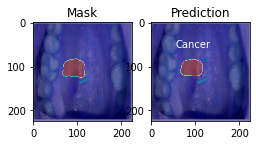

In [ ]:
n=n+1
plt.subplot(231)
prediction = pred4_b[n]
prediction = prediction[:,:,0]
plt.title('Mask')
plt.imshow(train_images[n])
ground_truth=train_masks[n]
gt=ground_truth[:,:,0]
plt.imshow(gt, cmap='jet', alpha=0.5)
#plt.text(10, 10, 'Cancer', bbox=dict(fill=False, edgecolor='red', linewidth=2))
#plt.savefig("Testing image.png")
#im.save(d+f"{i}.jpeg")

#plt.subplot(232)
#plt.title('Testing Label')
#plt.legend(['Yellow = Legion', 'Purple = Non-Legion'])
#ground_truth=train_masks[n]
#gt=ground_truth[:,:,0]
#plt.imshow(gt)
#plt.savefig("Testing labe.png")

plt.subplot(232)
prediction = pred4_b[n]
prediction = prediction[:,:,0]
plt.title('Prediction')
plt.imshow(train_images[n])
plt.imshow(prediction, cmap='jet', alpha=0.5)
cancer_pixels = np.array(np.where(prediction == 1))
text_border = cancer_pixels[:,0]

plt.text((text_border[0]-30),(text_border[1]-30), 'Cancer', color="white", bbox=dict(fill=False, edgecolor='red', linewidth=0))
#plt.savefig("Testing image.png")
#im.save(d+f"{i}.jpeg")


#plt.subplot(234)
#plt.title('Prediction')
#prediction = weighted_preds[n]
#prediction = prediction[:,:,0]
#plt.imshow(prediction)

In [ ]:
img = cv2.imread("/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/nc7.jpg")
img = cv2.resize(img, (SIZE_Y, SIZE_X))
imageio.imwrite("/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/nnc7.jpg", img)

In [ ]:
#Input shape to the model is 224 x 224. SO resize input image to this shape.
from tensorflow.keras.utils import load_img, img_to_array
img1 = load_img('/content/nwb.jpg', target_size=(224, 224)) #VGG user 224 as input

img = cv2.imread("/content/nwb.jpg")
img = cv2.resize(img, (SIZE_Y, SIZE_X))

# convert the image to an array
img11 = img_to_array(img)
img11 = np.expand_dims(img1, axis=0)

preddd = model1.predict(img11)
for i in range(len(preddd)):
  weighted_preds = np.where(preddd[:,:,:,:] > 0.1, 1, 0)

1/1 [==============================] - 2s 2s/step


Text(81, 122, 'Non-cancer')

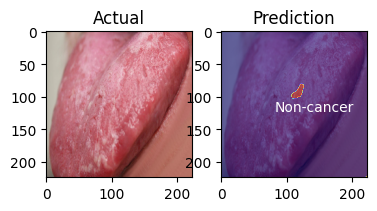

In [ ]:
plt.subplot(231)
#prediction = img11
#prediction = prediction[:,:,0]
plt.title('Actual')
plt.imshow(img1)
#plt.imshow(gt, cmap='jet', alpha=0.5)

plt.subplot(232)
prediction = weighted_preds[0]
prediction = prediction[:,:,0]
plt.title('Prediction')
plt.imshow(img11[0])
plt.imshow(prediction, cmap='jet', alpha=0.5)
cancer_pixels = np.array(np.where(prediction == 1))
text_border = cancer_pixels[:,0]

plt.text((text_border[0]),(text_border[1]), 'Non-cancer', color="white", bbox=dict(fill=False, edgecolor='red', linewidth=0))
#plt.savefig("Testing image.png")
#im.save(d+f"{i}.jpeg")


#plt.subplot(234)
#plt.title('Prediction')
#prediction = weighted_preds[n]
#prediction = prediction[:,:,0]
#plt.imshow(prediction)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:26: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:32: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version,

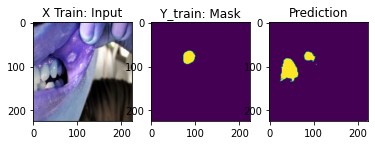

In [ ]:
import random
from PIL import Image
test_img_number = random.randint(0, len(train_images))
for i in range(len(train_images)):
  test_img = train_images[i]
  ground_truth=train_masks[i]
  test_img_input=np.expand_dims(test_img, 0)

  #test_img_input1 = preprocess_input3(test_img_input)

  #prediction = (model4.predict(test_img_input)[0,:,:,0] > 0.5).astype(np.uint8)
  prediction = weighted_preds[i]
  prediction = prediction[:,:,0]
  #prediction = model2.predict(test_img_input1)
  #test_prediction1 = np.argmax(prediction, axis=3)
  #im = Image.fromarray(test_prediction1)
  # im.save(d+f"{i}.jpeg")

  #y_img = np.argmax(ground_truth, axis=3)
  plt.subplot(231)
  plt.title('X Train: Input')
  plt.imshow(train_images[i])
  #plt.savefig("Testing image.png")
  #im.save(d+f"{i}.jpeg")

  plt.subplot(232)
  plt.title('Y_train: Mask')
  gt=ground_truth[:,:,0]
  plt.imshow(gt)
  #plt.savefig("Testing labe.png")

  plt.subplot(233)
  plt.title('Prediction')
  plt.imshow(prediction)
  plt.savefig("/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/Hybrid predictions/" + str(i) +  ".png")

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import glob
import cv2
import pickle

from keras.models import Sequential, Model
from keras.layers import Conv2D
import os
from keras.applications.vgg16 import VGG16
from keras.applications.resnet import ResNet101
from tensorflow.keras.applications.inception_v3 import InceptionV3
from keras.applications.resnet import ResNet50
from keras.models import Sequential
from keras.layers.core import Flatten, Dense, Dropout
from keras.layers.convolutional import Convolution2D, MaxPooling2D, ZeroPadding2D
from tensorflow.keras.optimizers import SGD
import numpy as np
from matplotlib import pyplot as plt
from keras.models import Model

In [ ]:
#Understand the filters in the model
#Let us pick the first hidden layer as the layer of interest.
layer1 = model1.layers #Conv layers at 1, 3, 6, 8, 11, 13, 15
filters = model1.layers[3].get_weights()
print(layer1[3].name)

layer2 = model2.layers #Conv layers at 1, 3, 6, 8, 11, 13, 15
filters = model2.layers[3].get_weights()
print(layer2[1].name)

layer4 = model4.layers #Conv layers at 1, 3, 6, 8, 11, 13, 15
filters = model4.layers[3].get_weights()
print(layer4[3].name)

conv0
conv2d
conv0


AttributeError: ignored

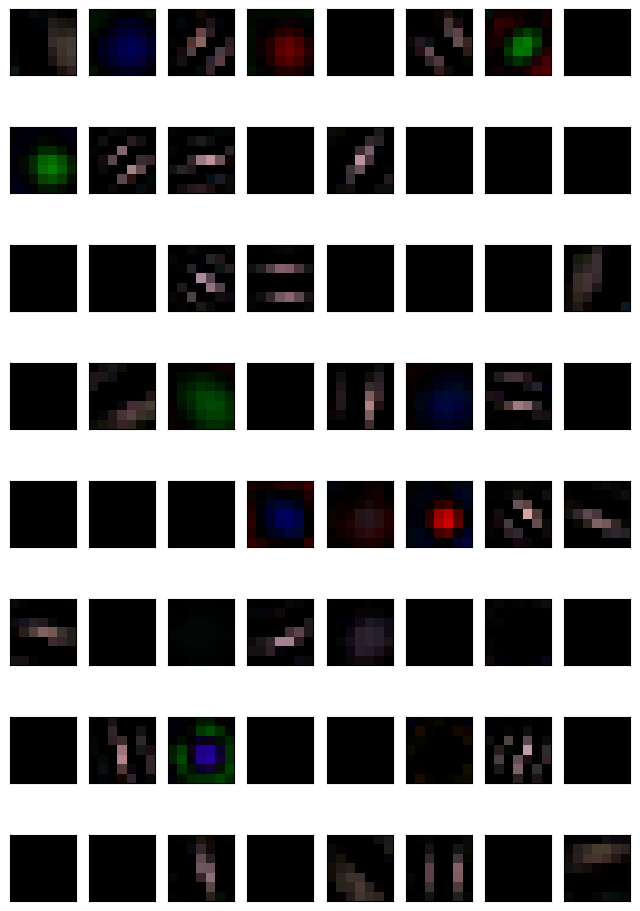

In [ ]:
# plot filters

fig1=plt.figure(figsize=(8, 12))
columns = 8
rows = 8
n_filters = columns * rows
for i in range(1, n_filters +1):
    f = filters[0][: ,: ,: ,[i-1]]
    fig1 =plt.subplot(rows, columns, i)
    fig1.set_xticks([])  #Turn off axis
    fig1.set_yticks([])
    plt.imshow(f[:, :,:, 0], cmap='gray') #Show only the filters from 0th channel (R)
    #ix += 1
plt.show()

In [ ]:
conv_layer_index1 =[]
conv_layer_index2 =[]
conv_layer_index4 =[]

for i in range(199):
  if layer1[i].name.find('conv') != -1:
    conv_layer_index1.append(i)

for i in range(352):
  if layer2[i].name.find('conv') != -1:
    conv_layer_index2.append(i)

for i in range(418):
  if layer4[i].name.find('conv') != -1:
    conv_layer_index4.append(i)

In [ ]:
#### Now plot filter outputs

#Define a new truncated model to only include the conv layers of interest
#conv_layer_index = [1, 3, 6, 8, 11, 13, 15]
#conv_layer_index = [1, 3, 6]  #TO define a shorter model
outputs1 = [model1.layers[i].output for i in conv_layer_index1]
model_short1 = Model(inputs=model1.inputs, outputs=outputs1)

outputs2 = [model2.layers[i].output for i in conv_layer_index2]
model_short2 = Model(inputs=model2.inputs, outputs=outputs2)

outputs4 = [model4.layers[i].output for i in conv_layer_index4]
model_short4 = Model(inputs=model4.inputs, outputs=outputs4)

print(model_short1.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 data (InputLayer)              [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 bn_data (BatchNormalization)   (None, None, None,   9           ['data[0][0]']                   
                                3)                                                                
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, None, None,   0          ['bn_data[0][0]']                
                                3)                                                            

In [ ]:
#Input shape to the model is 224 x 224. SO resize input image to this shape.
from tensorflow.keras.utils import load_img, img_to_array
img10 = load_img('/content/nwb.jpg', target_size=(224, 224)) #VGG user 224 as input
#img2 = load_img('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized cancer/100.jpg', target_size=(224, 224)) #VGG user 224 as input
#img3 = load_img('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized cancer/107.jpeg', target_size=(224, 224)) #VGG user 224 as input

# convert the image to an array
img1 = img_to_array(img10)
#img2 = img_to_array(img2)
#img3 = img_to_array(img3)

# expand dimensions to match the shape of model input
img11 = np.expand_dims(img1, axis=0)
#img22 = np.expand_dims(img2, axis=0)
#img33 = np.expand_dims(img3, axis=0)

In [ ]:
img3 = np.expand_dims(train_images[2], axis=0)

1/1 [==============================] - 2s 2s/step


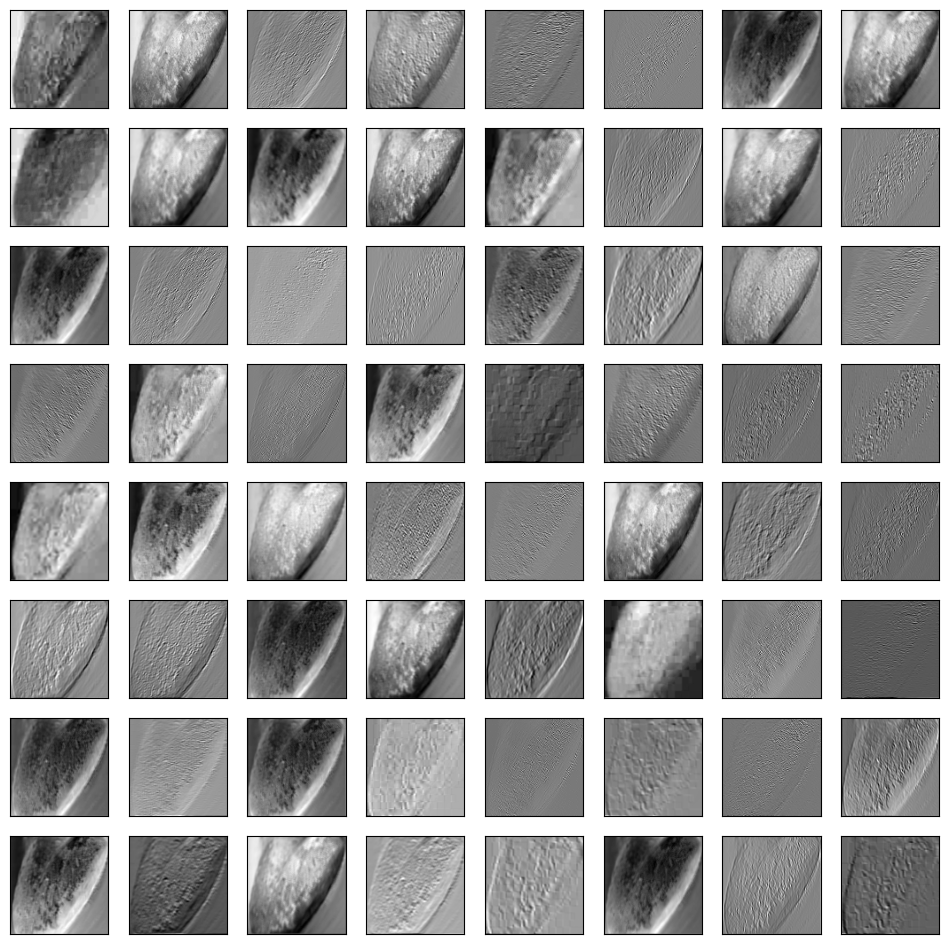

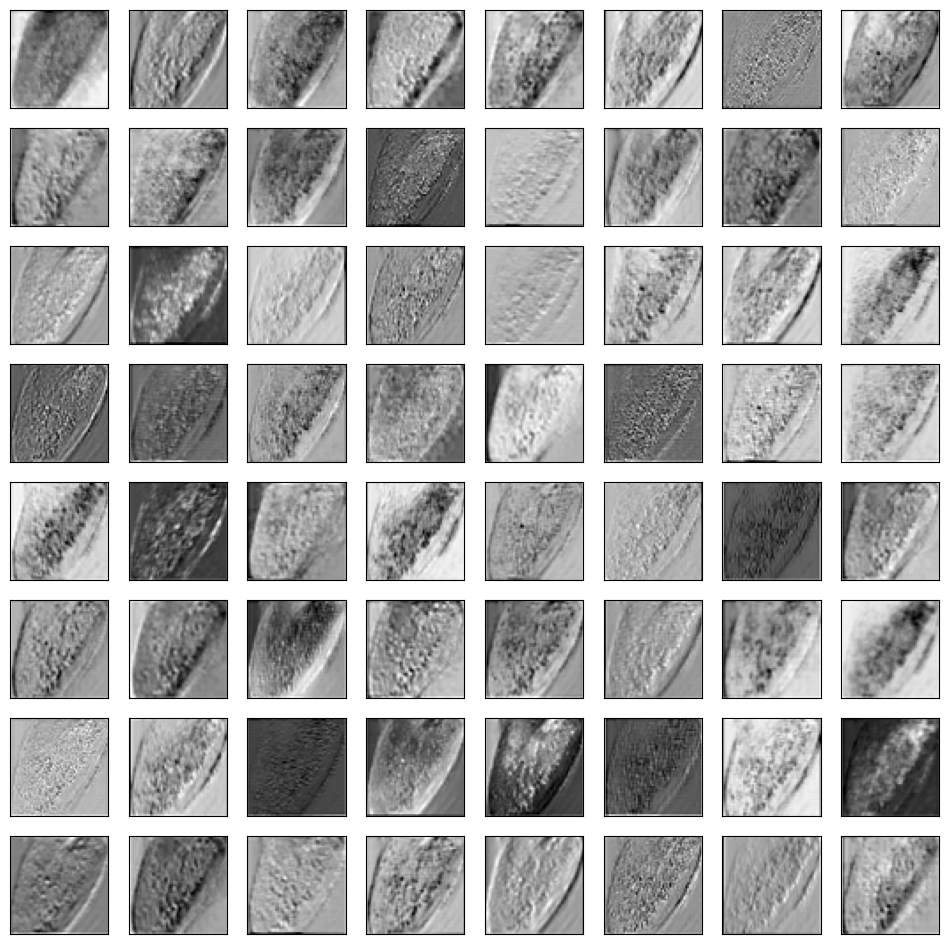

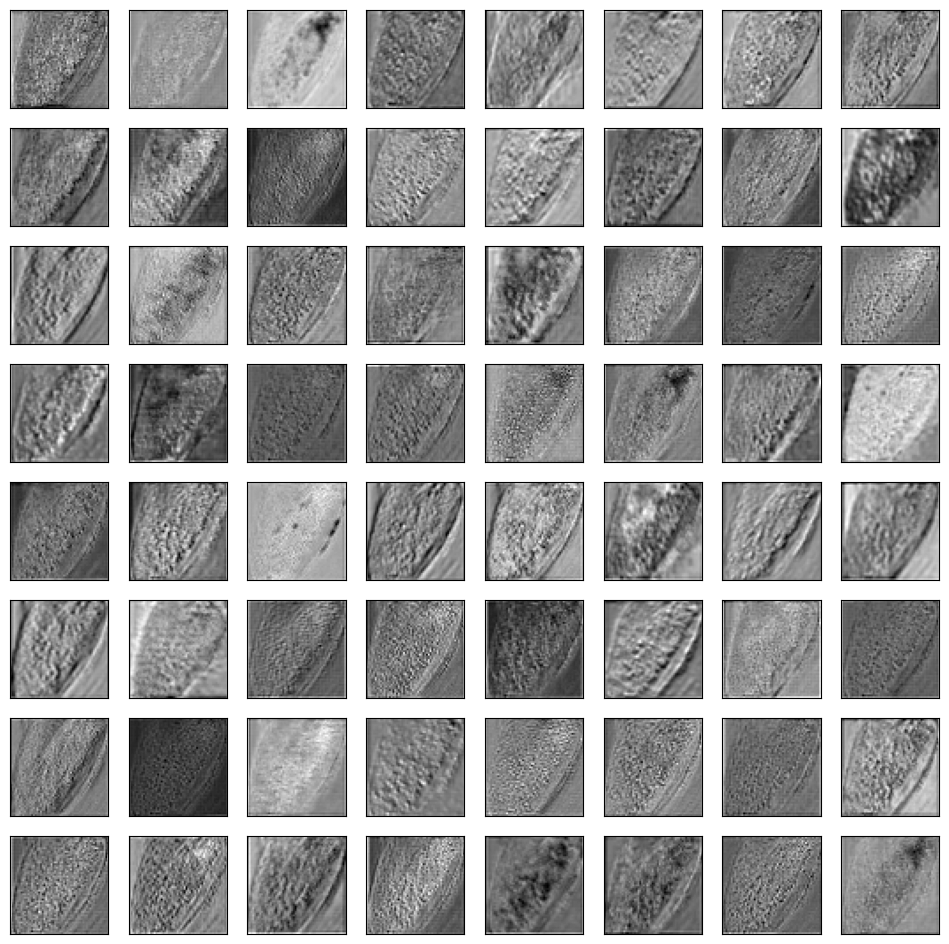

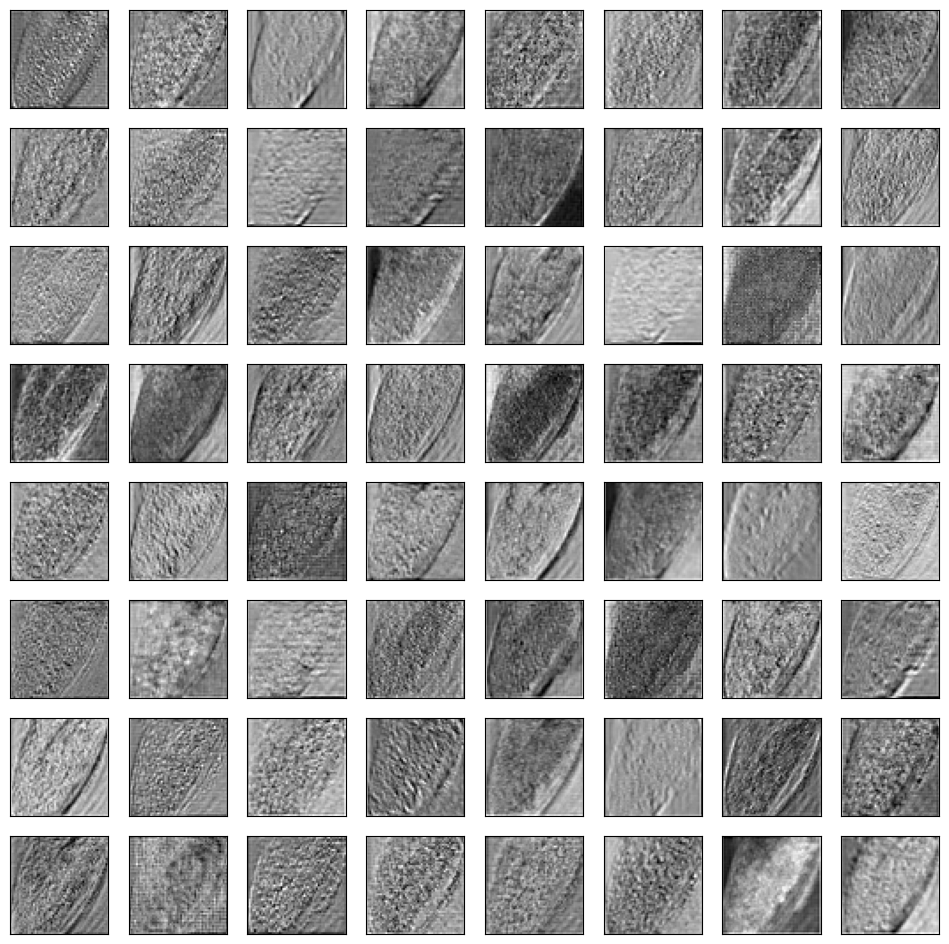

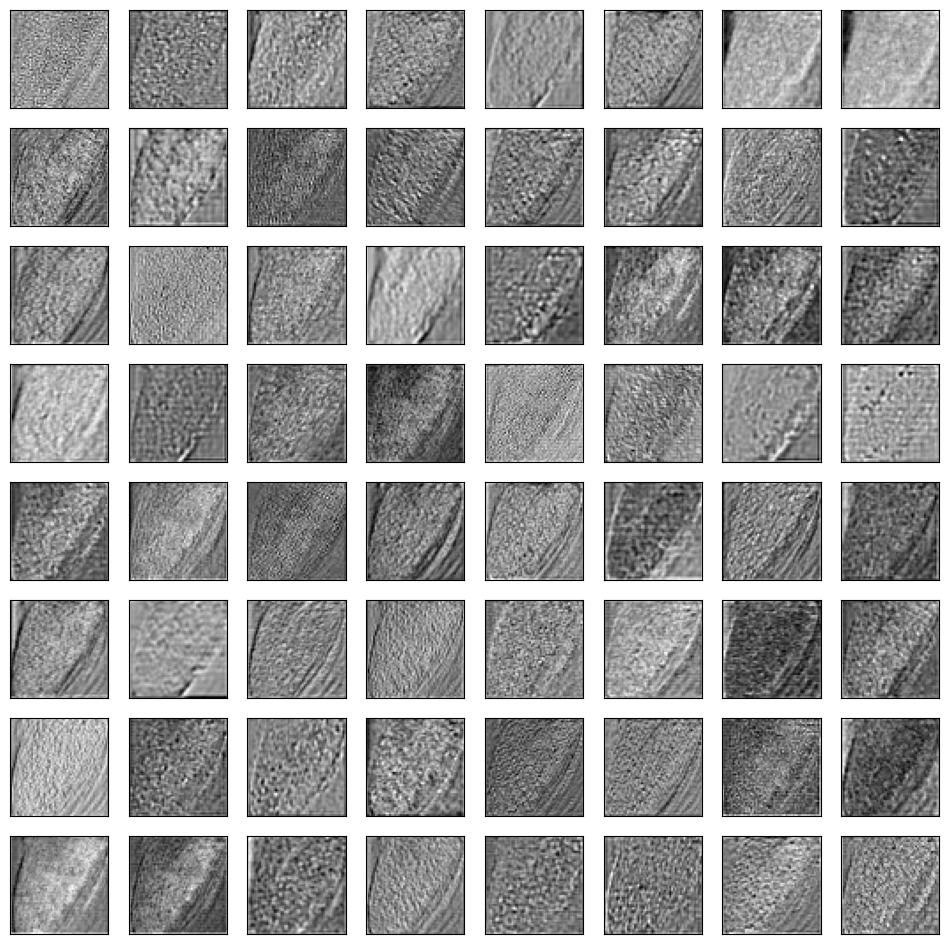

...

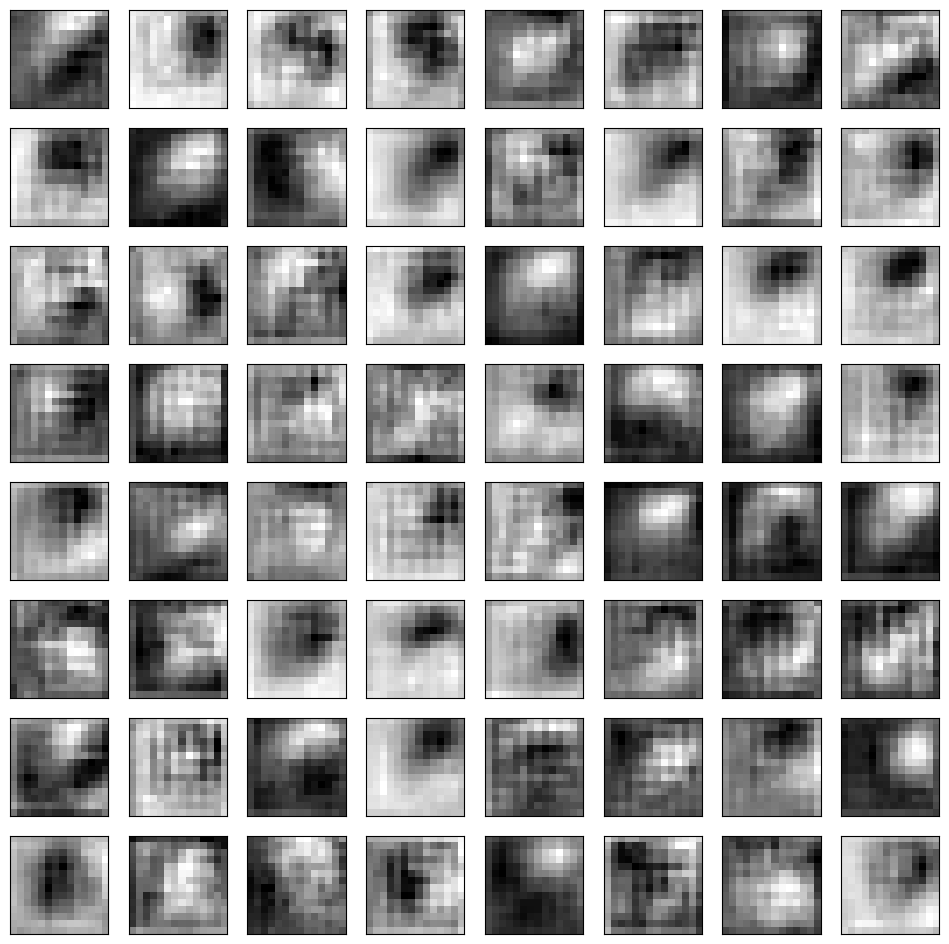

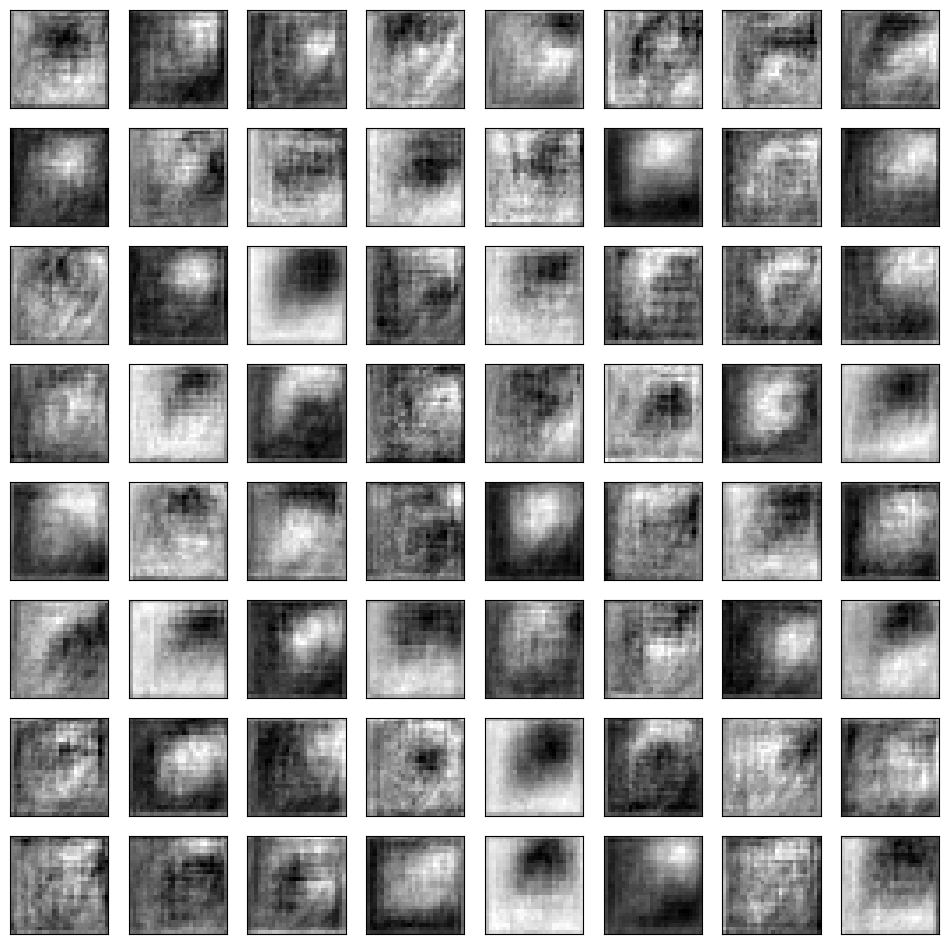

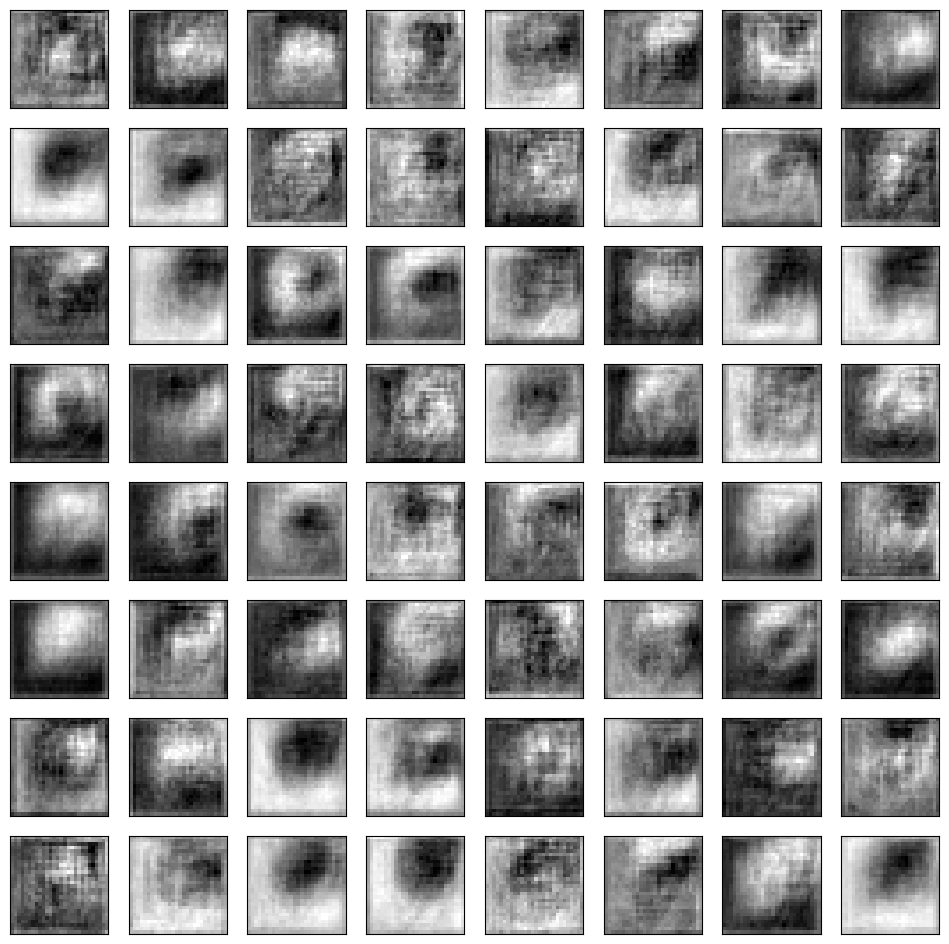

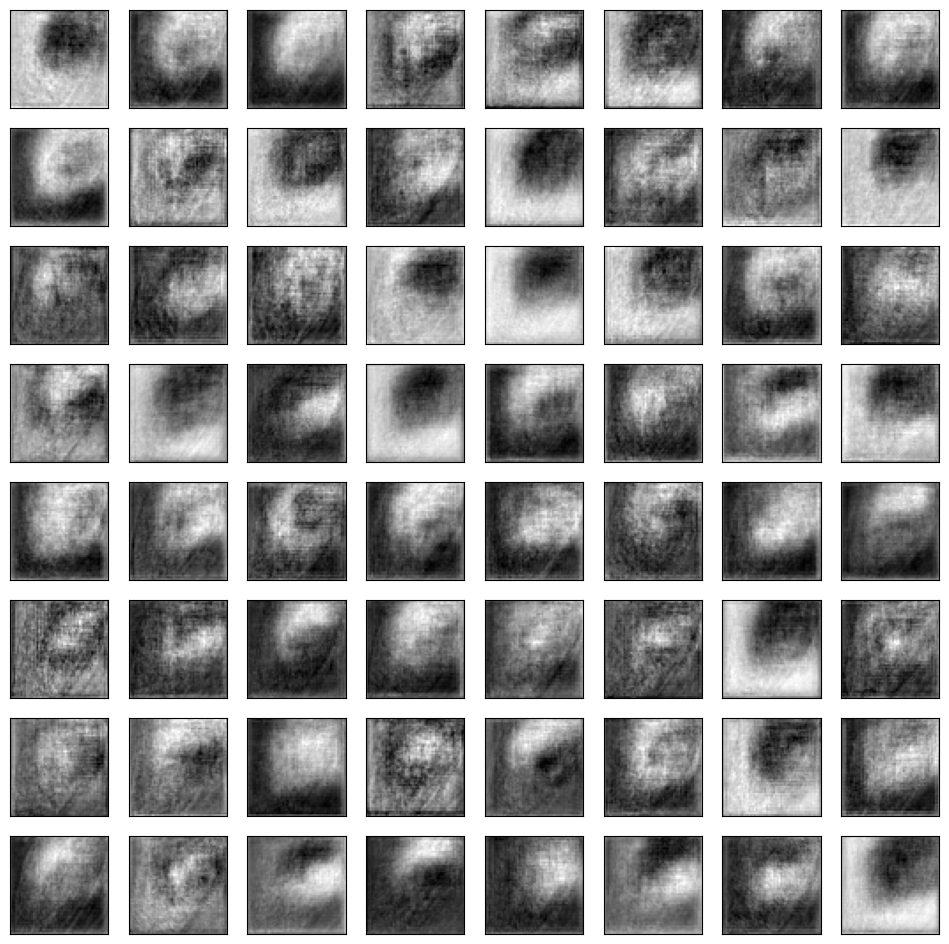

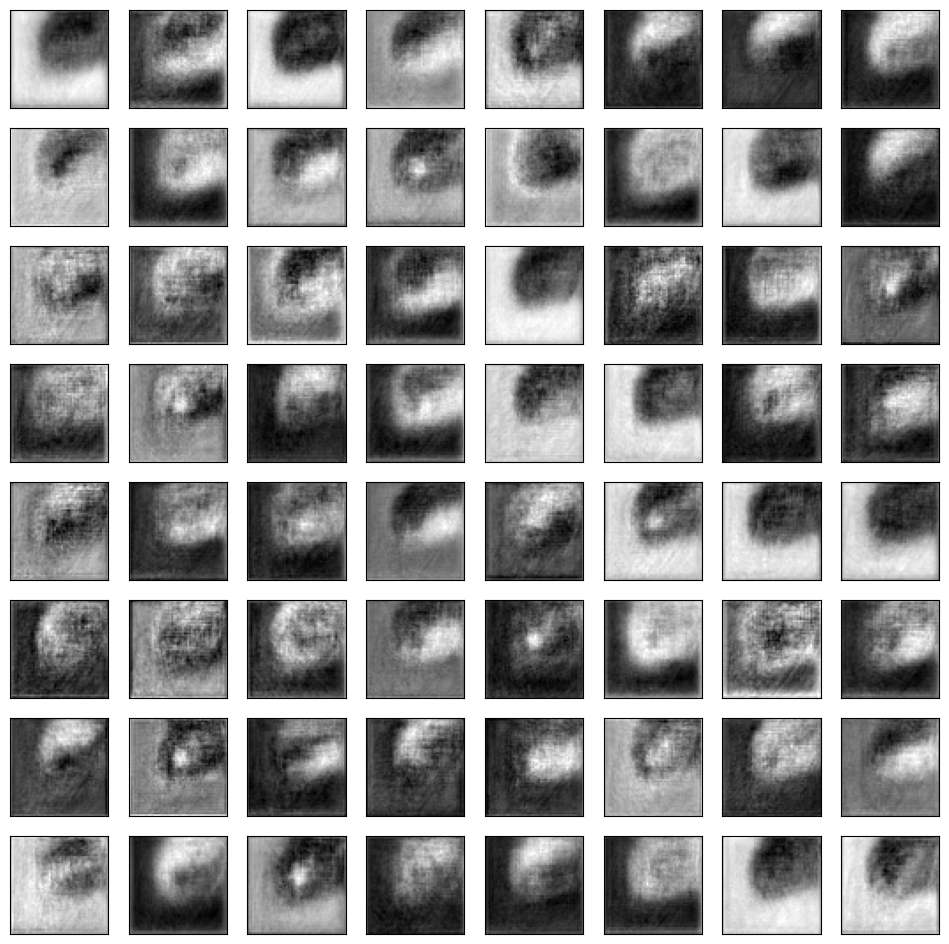

IndexError: ignored

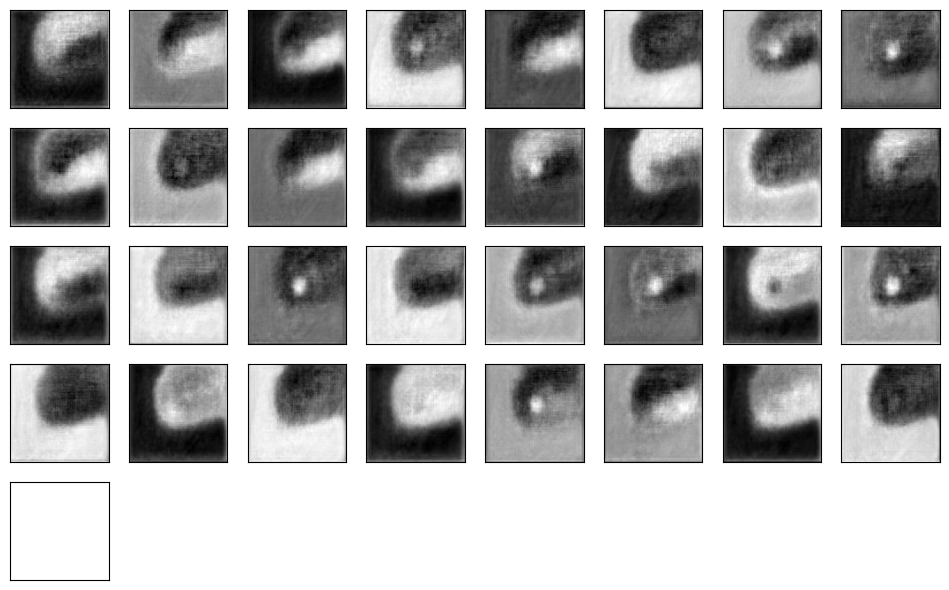

In [ ]:
# Generate feature output by predicting on the input image
feature_output1 = model_short1.predict(img11)

columns = 8
rows = 8
for ftr in feature_output1:
    #pos = 1
    fig=plt.figure(figsize=(12, 12))
    for i in range(1, columns*rows +1):
        fig =plt.subplot(rows, columns, i)
        fig.set_xticks([])  #Turn off axis
        fig.set_yticks([])
        plt.imshow(ftr[0, :, :, i-1], cmap='gray')
        #pos += 1
    plt.show()

In [ ]:
feature_output2 = model_short4.predict(img1)

columns = 5
rows = 5
for ftr in feature_output2:
    #pos = 1
    fig=plt.figure(figsize=(12, 12))
    for i in range(1, columns*rows +1):
        fig =plt.subplot(rows, columns, i)
        fig.set_xticks([])  #Turn off axis
        fig.set_yticks([])
        plt.imshow(ftr[0, :, :, i-1], cmap='gray')
        #pos += 1
    plt.show()

ValueError: ignored

In [ ]:
feature_output4 = model_short4.predict(img1)

columns = 8
rows = 8
for ftr in feature_output4:
    #pos = 1
    fig=plt.figure(figsize=(12, 12))
    for i in range(1, columns*rows +1):
        fig =plt.subplot(rows, columns, i)
        fig.set_xticks([])  #Turn off axis
        fig.set_yticks([])
        plt.imshow(ftr[0, :, :, i-1], cmap='gray')
        #pos += 1
    plt.show()

ValueError: ignored

In [ ]:
tpr

0.6669617597813745

In [ ]:
fpr

0.005386072353266246

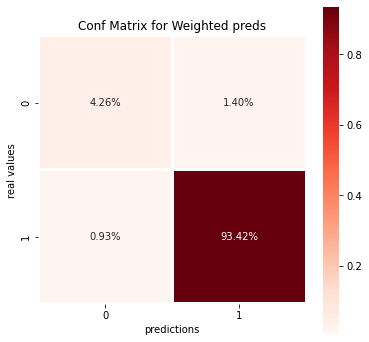

In [ ]:
# CONFUSION MATRIX for binary image segmentationmodels
import seaborn as sns

FP = len(np.where(weighted_preds - train_masks  == 1)[0])
FN = len(np.where(weighted_preds - train_masks  == -1)[0])
TP = len(np.where(weighted_preds + train_masks ==2)[0])
TN = len(np.where(weighted_preds + train_masks == 0)[0])
cmat = [[TP, FN], [FP, TN]]
fpr = FP/(FP+TN)
tpr = TP/(TP+FN)

plt.figure(figsize = (6,6))
sns.heatmap(cmat/np.sum(cmat), cmap="Reds", annot=True, fmt = '.2%', square=1,   linewidth=2.)
plt.xlabel("predictions")
plt.ylabel("real values")
plt.title("Conf Matrix for Weighted preds")
plt.show()

In [ ]:
from sklearn.metrics import roc_curve, auc # roc curve tools
from skimage.filters import gaussian

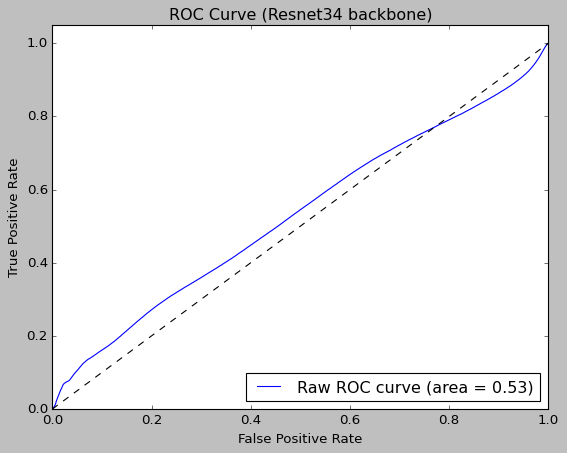

In [ ]:
#pred1 = model1.predict(X_test)

ground_truth_labels = y_test.ravel() # we want to make them into vectors
score_value = pred1.ravel() # we want to make them into vectors

fpr, tpr, _ = roc_curve(ground_truth_labels,score_value)
roc_auc = auc(fpr,tpr)

fig, ax = plt.subplots(1,1)
ax.plot(fpr, tpr, label='Raw ROC curve (area = %0.2f)' % roc_auc)
ax.plot([0, 1], [0, 1], 'k--')
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_title('ROC Curve (Resnet34 backbone)')
ax.legend(loc="lower right")

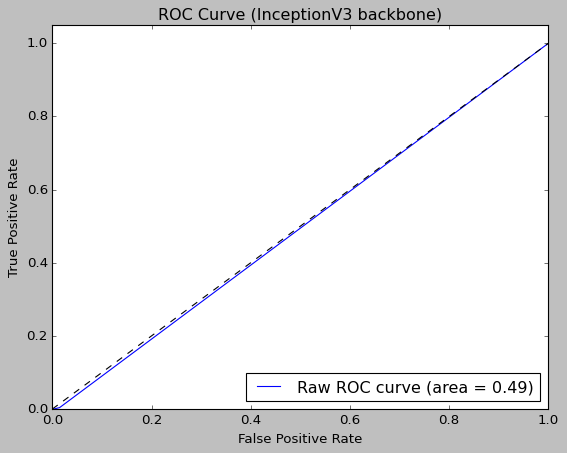

In [ ]:
#pred2 = model2.predict(X_test)

ground_truth_labels = y_test.ravel() # we want to make them into vectors
score_value = pred2.ravel() # we want to make them into vectors

fpr, tpr, _ = roc_curve(ground_truth_labels,score_value)
roc_auc = auc(fpr,tpr)

fig, ax = plt.subplots(1,1)
ax.plot(fpr, tpr, label='Raw ROC curve (area = %0.2f)' % roc_auc)
ax.plot([0, 1], [0, 1], 'k--')
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_title('ROC Curve (InceptionV3 backbone)')
ax.legend(loc="lower right")



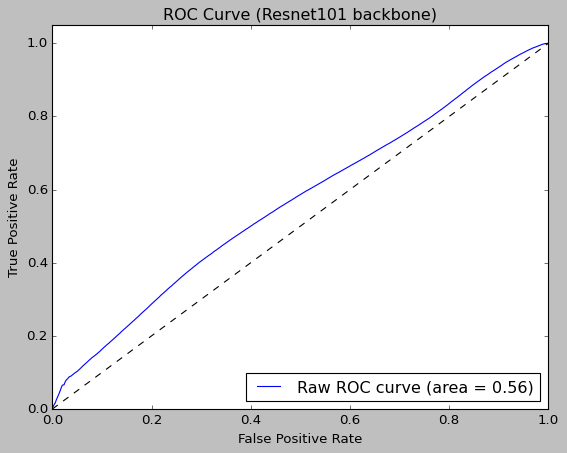

In [ ]:
#pred4 = model4.predict(X_test)

ground_truth_labels = y_test.ravel() # we want to make them into vectors
score_value = pred4.ravel() # we want to make them into vectors

fpr, tpr, _ = roc_curve(ground_truth_labels,score_value)
roc_auc = auc(fpr,tpr)

fig, ax = plt.subplots(1,1)
ax.plot(fpr, tpr, label='Raw ROC curve (area = %0.2f)' % roc_auc)
ax.plot([0, 1], [0, 1], 'k--')
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_title('ROC Curve (Resnet101 backbone)')
ax.legend(loc="lower right")

In [ ]:
pred4 = model4.predict(X1)
pred2 = model2.predict(X1)
pred1 = model1.predict(X1)

6/6 [==============================] - 42s 7s/step


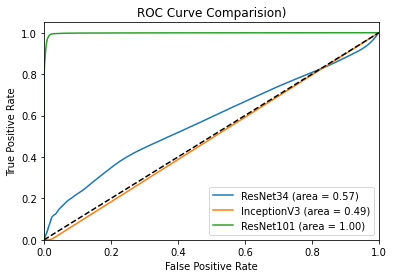

In [ ]:
ground_truth_labels = y1.ravel() # we want to make them into vectors
score_value4 = pred4.ravel()
score_value2 = pred2.ravel()
score_value1 = pred1.ravel()

fpr1, tpr1, _ = roc_curve(ground_truth_labels,score_value1)
roc_auc1 = auc(fpr1,tpr1)
fpr2, tpr2, _ = roc_curve(ground_truth_labels,score_value2)
roc_auc2 = auc(fpr2,tpr2)
fpr4, tpr4, _ = roc_curve(ground_truth_labels,score_value4)
roc_auc4 = auc(fpr4,tpr4)

fig, ax = plt.subplots(1,1)
ax.plot(fpr1, tpr1, label='ResNet34 (area = %0.2f)' % roc_auc1)
ax.plot(fpr2, tpr2, label='InceptionV3 (area = %0.2f)' % roc_auc2)
ax.plot(fpr4, tpr4, label='ResNet101 (area = %0.2f)' % roc_auc4)
ax.plot([0, 1], [0, 1], 'k--')
ax.set_xlim([0.0, 1.0])
ax.set_ylim([0.0, 1.05])
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_title('ROC Curve Comparision)')
ax.legend(loc="lower right")

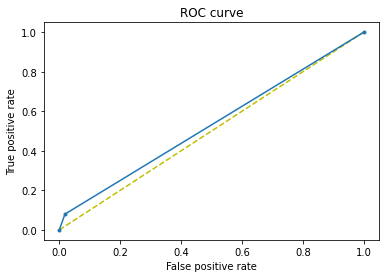

In [ ]:
from sklearn import metrics

y_true = []
y_pred = []
for pred in pred1_b:
  #pred = model1.predict(img)  # get prediction for each pixel in the image
  # flatten all targets
  y_pred.append(pred.flatten())  # flatten all predictions

for true_seg in train_masks:
  y_true.append(true_seg.flatten())

# concatenate all predictions and targets:
y_true = np.concatenate(y_true, axis=0)
y_pred = np.concatenate(y_pred, axis=0)
# copte the ROC curve
fpr, tpr, thresholds = metrics.roc_curve(y_true, y_pred)
plt.figure(1)
plt.plot([0, 1], [0, 1], 'y--')
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.show()

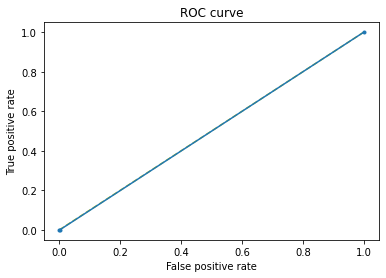

In [ ]:
y_true = []
y_pred = []
for pred in pred2_b:
  #pred = model1.predict(img)  # get prediction for each pixel in the image
  # flatten all targets
  y_pred.append(pred.flatten())  # flatten all predictions

for true_seg in train_masks:
  y_true.append(true_seg.flatten())

# concatenate all predictions and targets:
y_true = np.concatenate(y_true, axis=0)
y_pred = np.concatenate(y_pred, axis=0)
# copte the ROC curve
fpr, tpr, thresholds = metrics.roc_curve(y_true, y_pred)
plt.figure(1)
plt.plot([0, 1], [0, 1], 'y--')
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.show()

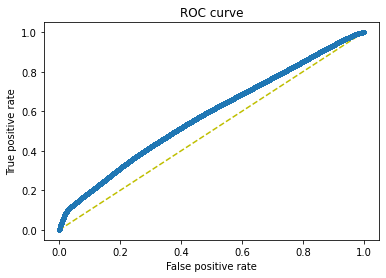

In [ ]:
y_true = []
y_pred = []
for pred in pred4:
  #pred = model1.predict(img)  # get prediction for each pixel in the image
  # flatten all targets
  y_pred.append(pred.flatten())  # flatten all predictions

for true_seg in train_masks:
  y_true.append(true_seg.flatten())

# concatenate all predictions and targets:
y_true = np.concatenate(y_true, axis=0)
y_pred = np.concatenate(y_pred, axis=0)
# copte the ROC curve
fpr, tpr, thresholds = metrics.roc_curve(y_true, y_pred)
plt.figure(1)
plt.plot([0, 1], [0, 1], 'y--')
plt.plot(fpr, tpr, marker='.')
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

plt.style.use('classic')
#############################################################
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from keras.layers import Activation, Dropout, Flatten, Dense
#from keras import backend as K
####################################################
import os
import cv2
from PIL import Image
import numpy as np

In [ ]:
dataset = []  #Many ways to handle data, you can use pandas. Here, we are using a list format.
label = []  #Place holders to define add labels. We will add 0 to all parasitized images and 1 to uninfected.

In [ ]:
image_names = glob.glob("/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized cancer/*")
#image_names = glob.glob("/content/drive/MyDrive/oral cancer Images/nir/*")
image_names.sort()
image_names_subset = image_names[0:233]
#images = [cv2.imread(img) for img in image_names_subset]
for img in image_names_subset:
  dataset.append(cv2.imread(img))
  label.append(1)
#label = label.append(0) for img in image_names_subset]
#train_images = np.array(images)
#train_images = np.expand_dims(image_dataset, axis = 3)

In [ ]:
image_names2 = glob.glob("/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/val/resized nc/*")
#image_names = glob.glob("/content/drive/MyDrive/oral cancer Images/nir/*")
image_names2.sort()
image_names_subset2 = image_names2[0:52]
#images = [cv2.imread(img) for img in image_names_subset]

#label = label.append(0) for img in image_names_subset]
#train_images = np.expand_dims(image_dataset, axis = 3)
for img in image_names_subset2:
  dataset.append(cv2.imread(img))
  label.append(0)

dataset = np.array(dataset)
label = np.array(label)
np.array(label, dtype=bool)

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,

In [ ]:
from sklearn.model_selection import train_test_split
#from keras.utils import to_categorical

X_train, X_test, y_train, y_test = train_test_split(dataset, label, test_size = 0.20, random_state = 0)

#Without scaling (normalize) the training may not converge.
#Normalization is a rescaling of the data from the original range
#so that all values are within the range of 0 and 1.
from tensorflow.keras.utils import normalize
X_train = normalize(X_train, axis=1)
X_test = normalize(X_test, axis=1)

In [ ]:
INPUT_SHAPE = (224, 224, 3)   #change to (SIZE, SIZE, 3)

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from keras.layers import Activation, Dense, Flatten

In [ ]:
resnet_model = Sequential()

pretrained_model= tf.keras.applications.ResNet101(include_top=False,
                   input_shape=INPUT_SHAPE,
                   pooling='max',classes=1,
                   weights='imagenet')
for layer in pretrained_model.layers:
        layer.trainable=False

resnet_model.add(pretrained_model)

171446536/171446536 [==============================] - 1s 0us/step


In [ ]:
resnet_model.add(Flatten())
resnet_model.add(Dense(512, activation='relu'))
resnet_model.add(Dense(1, activation='sigmoid'))

resnet_model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101 (Functional)      (None, 2048)              42658176  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 512)               1049088   
                                                                 
 dense_1 (Dense)             (None, 1)                 513       
                                                                 
Total params: 43,707,777
Trainable params: 1,049,601
Non-trainable params: 42,658,176
_________________________________________________________________


In [ ]:
resnet_model.compile(optimizer=Adam(lr=0.001),loss='binary_crossentropy',metrics=['accuracy'])

#history = resnet_model.fit(X_train, validation_data=y_train, epochs=10)

history=resnet_model.fit(X_train,
          y_train,
          batch_size=16,
          epochs=20,
          verbose=1,
          validation_data=(X_test, y_test))

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/20
15/15 [==============================] - 108s 7s/step - loss: 2.5050 - accuracy: 0.7325 - val_loss: 1.0342 - val_accuracy: 0.8070
Epoch 2/20
15/15 [==============================] - 103s 7s/step - loss: 1.1264 - accuracy: 0.6447 - val_loss: 1.3014 - val_accuracy: 0.8070
Epoch 3/20
15/15 [==============================] - 105s 7s/step - loss: 0.8580 - accuracy: 0.7500 - val_loss: 0.5890 - val_accuracy: 0.8070
Epoch 4/20
15/15 [==============================] - 86s 6s/step - loss: 0.5939 - accuracy: 0.8202 - val_loss: 0.7753 - val_accuracy: 0.1930
Epoch 5/20
15/15 [==============================] - 84s 6s/step - loss: 0.8375 - accuracy: 0.6711 - val_loss: 0.7410 - val_accuracy: 0.1930
Epoch 6/20
15/15 [==============================] - 83s 6s/step - loss: 0.5831 - accuracy: 0.7149 - val_loss: 0.6283 - val_accuracy: 0.8070
Epoch 7/20
15/15 [==============================] - 83s 6s/step - loss: 0.5519 - accuracy: 0.8202 - val_loss: 0.5133 - val_accuracy: 0.8070
Epoch 8/20
15/15 

In [ ]:
resnet_model.save('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/C_Models/resnet101_20epochs.hdf5')

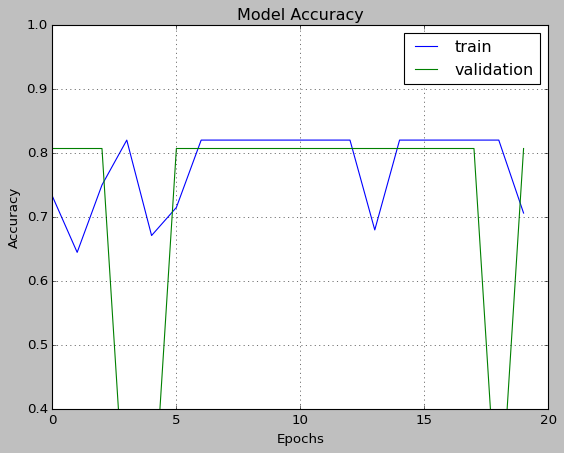

In [ ]:
fig1 = plt.gcf()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.axis(ymin=0.4,ymax=1)
plt.grid()
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'])
plt.show()

In [ ]:
inception_model = Sequential()

pretrained_model= tf.keras.applications.InceptionV3(include_top=False,
                   input_shape=INPUT_SHAPE,
                   pooling='max',classes=1,
                   weights='imagenet')
for layer in pretrained_model.layers:
        layer.trainable=False

inception_model.add(pretrained_model)

inception_model.add(Flatten())
inception_model.add(Dense(512, activation='relu'))
inception_model.add(Dense(1, activation='sigmoid'))

inception_model.summary()

87924736/87910968 [==============================] - 1s 0us/step
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 2048)              21802784  
                                                                 
 flatten_1 (Flatten)         (None, 2048)              0         
                                                                 
 dense_2 (Dense)             (None, 512)               1049088   
                                                                 
 dense_3 (Dense)             (None, 1)                 513       
                                                                 
Total params: 22,852,385
Trainable params: 1,049,601
Non-trainable params: 21,802,784
_________________________________________________________________


In [ ]:
inception_model.compile(optimizer=Adam(lr=0.001),loss='binary_crossentropy',metrics=['accuracy'])

history2=inception_model.fit(X_train,
          y_train,
          batch_size=16,
          epochs=20,
          verbose=1,
          validation_data=(X_test, y_test))

Epoch 1/20
15/15 [==============================] - 36s 2s/step - loss: 5.4240 - accuracy: 0.7325 - val_loss: 2.1688 - val_accuracy: 0.8070
Epoch 2/20
15/15 [==============================] - 29s 2s/step - loss: 0.8972 - accuracy: 0.7675 - val_loss: 0.3973 - val_accuracy: 0.9298
Epoch 3/20
15/15 [==============================] - 31s 2s/step - loss: 0.3432 - accuracy: 0.8991 - val_loss: 0.3569 - val_accuracy: 0.9298
Epoch 4/20
15/15 [==============================] - 29s 2s/step - loss: 0.2088 - accuracy: 0.9211 - val_loss: 0.3208 - val_accuracy: 0.9123
Epoch 5/20
15/15 [==============================] - 29s 2s/step - loss: 0.1413 - accuracy: 0.9386 - val_loss: 0.3708 - val_accuracy: 0.9123
Epoch 6/20
15/15 [==============================] - 29s 2s/step - loss: 0.1127 - accuracy: 0.9605 - val_loss: 0.3496 - val_accuracy: 0.9123
Epoch 7/20
15/15 [==============================] - 31s 2s/step - loss: 0.1397 - accuracy: 0.9430 - val_loss: 0.3347 - val_accuracy: 0.9123
Epoch 8/20
15/15 [==

In [ ]:
inception_model.save('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/C_Models/inceptionv3_20epochs.hdf5')

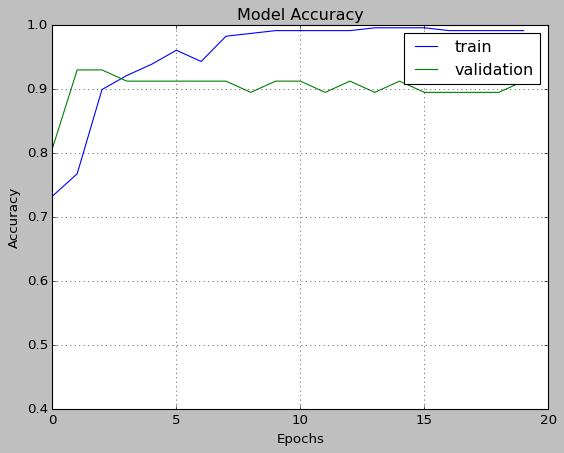

In [ ]:
fig1 = plt.gcf()
plt.plot(history2.history['accuracy'])
plt.plot(history2.history['val_accuracy'])
plt.axis(ymin=0.4,ymax=1)
plt.grid()
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'])
plt.show()

In [ ]:
from keras.models import load_model
# load model
resnet_model = load_model('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/C_Models/resnet101_20epochs.hdf5')
inception_model= load_model('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/C_Models/inceptionv3_20epochs.hdf5')


In [ ]:
layers1 = resnet_model.layers
resnet_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet101 (Functional)      (None, 2048)              42658176  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 512)               1049088   
                                                                 
 dense_1 (Dense)             (None, 1)                 513       
                                                                 
Total params: 43,707,777
Trainable params: 1,049,601
Non-trainable params: 42,658,176
_________________________________________________________________


In [ ]:
conv_layer_index1 =[]

for i in range(4):
  if layers1[i].name.find('conv') != -1:
    conv_layer_index1.append(i)

In [ ]:
from keras.preprocessing.image import load_img, img_to_array
img1 = load_img('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized cancer/1.jpg', target_size=(224, 224)) #VGG user 224 as input
img2 = load_img('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized cancer/2.jpg', target_size=(224, 224)) #VGG user 224 as input
img3 = load_img('/content/drive/MyDrive/oral cancer Images/OralCancer_Kaggle/train/resized cancer/3.jpg', target_size=(224, 224)) #VGG user 224 as input

# convert the image to an array
img1 = img_to_array(img1)
img2 = img_to_array(img2)
img3 = img_to_array(img3)

# expand dimensions to match the shape of model input
img1 = np.expand_dims(img1, axis=0)
img2 = np.expand_dims(img2, axis=0)
img3 = np.expand_dims(img3, axis=0)

In [ ]:
print("Generate a prediction")
prediction = inception_model.predict(dataset[:])
print("prediction shape:", prediction.shape)
prediction

Generate a prediction
9/9 [==============================] - 35s 3s/step
prediction shape: (285, 1)


array([[1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],
       [1.],

In [ ]:
print("Generate a prediction")
prediction = resnet_model.predict(dataset[:])
print("prediction shape:", prediction.shape)
prediction

Generate a prediction
9/9 [==============================] - 90s 9s/step
prediction shape: (285, 1)


array([[0.99986094],
       [0.99998516],
       [0.9996627 ],
       [0.9999824 ],
       [0.9993026 ],
       [0.99999267],
       [0.9999804 ],
       [0.99999976],
       [0.99999934],
       [0.9999997 ],
       [0.9999985 ],
       [0.9999984 ],
       [0.9989603 ],
       [0.99999917],
       [0.9999977 ],
       [0.99944085],
       [0.99998903],
       [0.9999841 ],
       [0.99965125],
       [0.85376936],
       [0.99986094],
       [0.99999946],
       [0.9999726 ],
       [0.9988446 ],
       [0.99617064],
       [0.9999977 ],
       [0.99998903],
       [0.9999841 ],
       [0.9999992 ],
       [0.99999714],
       [0.9997332 ],
       [0.99101895],
       [1.        ],
       [0.9984818 ],
       [0.9999996 ],
       [0.9999997 ],
       [0.9737265 ],
       [0.9856744 ],
       [0.99996936],
       [0.99999595],
       [0.67391187],
       [1.        ],
       [0.9997585 ],
       [0.9999903 ],
       [1.        ],
       [0.9999999 ],
       [0.99993443],
       [0.999

In [ ]:
label[:]

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [ ]:
label.shape

(285,)

In [ ]:
_, acc = model1.evaluate(X1, y1)
print("Accuracy = ", (acc * 100.0), "%")

In [ ]:
_, acc = resnet_model.evaluate(X_test, y_test)
print("Accuracy = ", (acc * 100.0), "%")

2/2 [==============================] - 17s 7s/step - loss: 0.4894 - accuracy: 0.8070
Accuracy =  80.70175647735596 %


In [ ]:
_, acc = inception_model.evaluate(X_test, y_test)
print("Accuracy = ", (acc * 100.0), "%")

2/2 [==============================] - 13s 5s/step - loss: 0.3443 - accuracy: 0.9123
Accuracy =  91.22806787490845 %


In [ ]:
#Confusion matrix
#We compare labels and plot them based on correct or wrong predictions.
#Since sigmoid outputs probabilities we need to apply threshold to convert to label.

mythreshold=0.5
from sklearn.metrics import confusion_matrix

y_pred = (inception_model.predict(dataset)>= mythreshold).astype(int)
cm=confusion_matrix(label, y_pred)
print(cm)

9/9 [==============================] - 33s 4s/step
[[  0  52]
 [  0 233]]


In [ ]:
y_pred = (resnet_model.predict(dataset)>= mythreshold).astype(int)
cm=confusion_matrix(label, y_pred)
print(cm)

9/9 [==============================] - 84s 9s/step
[[  0  52]
 [  3 230]]


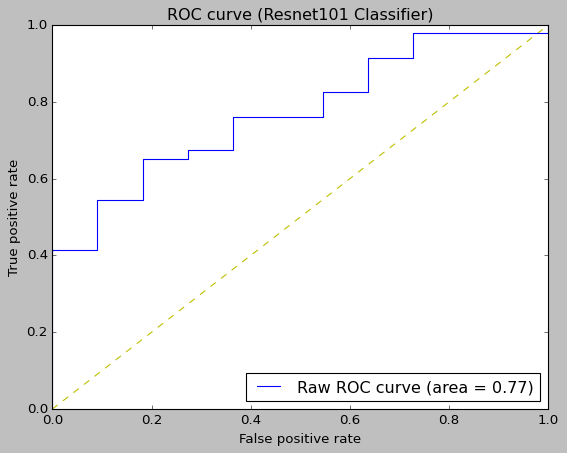

In [ ]:
#ROC
from sklearn.metrics import roc_curve, auc
y_preds = resnet_model.predict(X_test).ravel()

fpr, tpr, thresholds = roc_curve(y_test, y_preds)
roc_auc = auc(fpr,tpr)

plt.figure(1)
plt.plot([0, 1], [0, 1], 'y--')
plt.plot(fpr, tpr,label='Raw ROC curve (area = %0.2f)' % roc_auc)
plt.legend(loc="lower right")
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve (Resnet101 Classifier)')

plt.show()

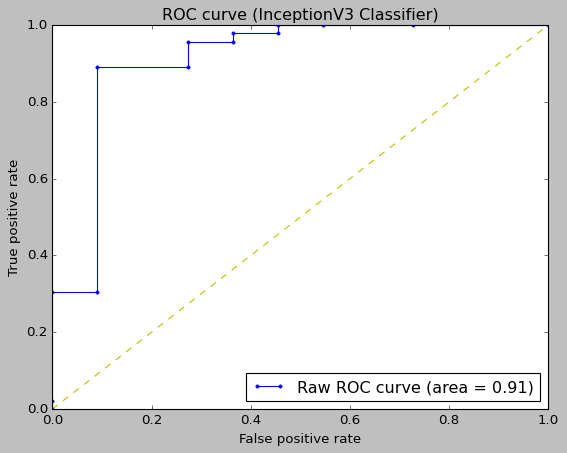

In [ ]:
y_preds = inception_model.predict(X_test).ravel()

fpr, tpr, thresholds = roc_curve(y_test, y_preds)
roc_auc = auc(fpr,tpr)

plt.figure(1)
plt.plot([0, 1], [0, 1], 'y--')
plt.plot(fpr, tpr, marker='.' ,label='Raw ROC curve (area = %0.2f)' % roc_auc)
plt.legend(loc="lower right")
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve (InceptionV3 Classifier)')
plt.show()

9/9 [==============================] - 109s 12s/step


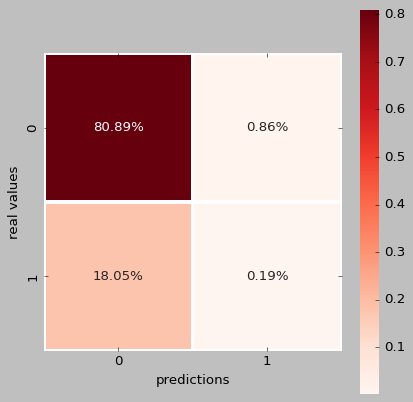

In [ ]:
# CONFUSION MATRIX for binary image segmentationmodels
import seaborn as sns


mythreshold=0.5
y_pred = (resnet_model.predict(dataset)>= mythreshold).astype(int)

FP = len(np.where(y_pred - label == 1)[0])
FN = len(np.where(y_pred - label == -1)[0])
TP = len(np.where(y_pred + label == 2)[0])
TN = len(np.where(y_pred + label == 0)[0])
cmat = [[TP, FN], [FP, TN]]

plt.figure(figsize = (6,6))
sns.heatmap(cmat/np.sum(cmat), cmap="Reds", annot=True, fmt = '.2%', square=1,   linewidth=2.)
plt.xlabel("predictions")
plt.ylabel("real values")
plt.show()

2/2 [==============================] - 12s 6s/step


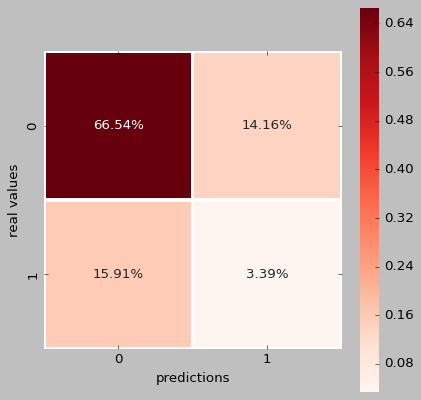

In [ ]:
# CONFUSION MATRIX for binary image segmentationmodels
import seaborn as sns


mythreshold=0.5
y_pred = (inception_model.predict(X_test)>= mythreshold).astype(int)

FP = len(np.where(y_pred - y_test == 1)[0])
FN = len(np.where(y_pred - y_test == -1)[0])
TP = len(np.where(y_pred + y_test == 2)[0])
TN = len(np.where(y_pred + y_test == 0)[0])
cmat = [[TP, FN], [FP, TN]]

plt.figure(figsize = (6,6))
sns.heatmap(cmat/np.sum(cmat), cmap="Reds", annot=True, fmt = '.2%', square=1,   linewidth=2.)
plt.xlabel("predictions")
plt.ylabel("real values")
plt.show()

9/9 [==============================] - 29s 3s/step


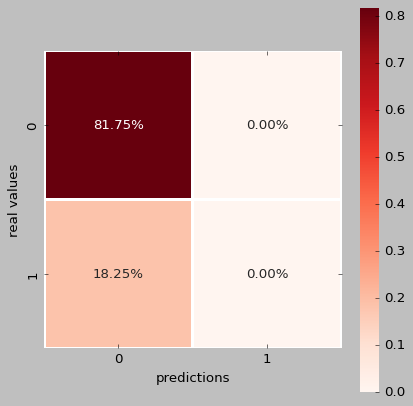

In [ ]:
# CONFUSION MATRIX for binary image segmentationmodels
import seaborn as sns


mythreshold=0.5
y_pred = (inception_model.predict(dataset)>= mythreshold).astype(int)

FP = len(np.where(y_pred - label == 1)[0])
FN = len(np.where(y_pred - label == -1)[0])
TP = len(np.where(y_pred + label == 2)[0])
TN = len(np.where(y_pred + label == 0)[0])
cmat = [[TP, FN], [FP, TN]]

plt.figure(figsize = (6,6))
sns.heatmap(cmat/np.sum(cmat), cmap="Reds", annot=True, fmt = '.2%', square=1,   linewidth=2.)
plt.xlabel("predictions")
plt.ylabel("real values")
plt.show()

In [ ]:
for i in y_pred:
  if y_pred[i] != 1:
    print(i)

In [ ]:
y_pred




array([[1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
       [1],
    

In [ ]:
dataset[126]

array([[[ 76,  84, 137],
        [ 74,  82, 135],
        [ 68,  78, 132],
        ...,
        [ 17,  14,  64],
        [ 29,  25,  74],
        [ 40,  37,  83]],

       [[ 75,  83, 136],
        [ 71,  79, 132],
        [ 63,  73, 127],
        ...,
        [  9,   6,  56],
        [ 19,  15,  64],
        [ 26,  23,  69]],

       [[ 74,  82, 135],
        [ 67,  75, 128],
        [ 57,  67, 121],
        ...,
        [  4,   0,  52],
        [  8,   3,  54],
        [ 12,   8,  57]],

       ...,

       [[ 33,  45, 127],
        [ 42,  54, 136],
        [ 53,  67, 149],
        ...,
        [181, 187, 232],
        [188, 196, 236],
        [195, 204, 242]],

       [[ 27,  40, 119],
        [ 39,  52, 131],
        [ 55,  70, 149],
        ...,
        [176, 182, 235],
        [181, 188, 238],
        [188, 195, 244]],

       [[ 26,  39, 117],
        [ 41,  54, 132],
        [ 58,  73, 152],
        ...,
        [172, 179, 236],
        [177, 184, 239],
        [183, 191, 244]]

In [ ]:
np.argwhere(y_pred == 0)

array([], shape=(0, 2), dtype=int64)